# **Projet 6 : Classifiez automatiquement des biens de consommation - Faisabilité NLP**

**Table des matières**<a id='toc0_'></a>    
- 1. [Introduction](#toc1_)    
  - 1.1. [Contexte](#toc1_1_)    
  - 1.2. [Mission](#toc1_2_)    
  - 1.3. [Objectif du Notebook](#toc1_3_)    
- 2. [Installation des librairies](#toc2_)    
- 3. [Importation des données](#toc3_)    
- 4. [Analyse exploratoire](#toc4_)    
  - 4.1. [Création du DataFrame de travail](#toc4_1_)    
- 5. [Pré-traitement des données textuelles](#toc5_)    
  - 5.1. [Variable product_category_tree](#toc5_1_)    
  - 5.2. [Variable description](#toc5_2_)    
    - 5.2.1. [Recherche de la meilleure Tokenization](#toc5_2_1_)    
    - 5.2.2. [Création d'une liste de stop_words personalisée ](#toc5_2_2_)    
    - 5.2.3. [Automatisation du nettoyage](#toc5_2_3_)    
      - 5.2.3.1. [Création des différents prétraitement de la variables description](#toc5_2_3_1_)    
  - 5.3. [Enregistrement des données](#toc5_3_)    
  - 5.4. [Visualisation](#toc5_4_)    
- 6. [Classification non supervisée.](#toc6_)    
  - 6.1. [Bags of words - CounterVecotrizer](#toc6_1_)    
    - 6.1.1. [Descrptions Lemmatisées](#toc6_1_1_)    
    - 6.1.2. [Descriptions Stemmées](#toc6_1_2_)    
  - 6.2. [Bags o words - TfidfVectorizer](#toc6_2_)    
    - 6.2.1. [Description Lemmatisée](#toc6_2_1_)    
    - 6.2.2. [Descriptions Stemmées](#toc6_2_2_)    
  - 6.3. [Word2Vec](#toc6_3_)    
    - 6.3.1. [CBOW](#toc6_3_1_)    
      - 6.3.1.1. [Description tokenisées avec les stop_words](#toc6_3_1_1_)    
      - 6.3.1.2. [Descriptions tokenisées sans les stop_words](#toc6_3_1_2_)    
    - 6.3.2. [Skip-gram](#toc6_3_2_)    
      - 6.3.2.1. [Descriptions tokenisées avec stop_words](#toc6_3_2_1_)    
      - 6.3.2.2. [Descriptions tokenisées sans les stop_words](#toc6_3_2_2_)    
  - 6.4. [Doc2Vec](#toc6_4_)    
    - 6.4.1. [PV-DBOW](#toc6_4_1_)    
      - 6.4.1.1. [Descriptions tokenisées avec les stop_words](#toc6_4_1_1_)    
      - 6.4.1.2. [Description tokenisées sans les stop_words](#toc6_4_1_2_)    
    - 6.4.2. [PV-DM](#toc6_4_2_)    
      - 6.4.2.1. [Descriptions tokenisées avec les stop_words](#toc6_4_2_1_)    
      - 6.4.2.2. [Description tokenisées sans les stop_words](#toc6_4_2_2_)    
  - 6.5. [BERT](#toc6_5_)    
    - 6.5.1. [DistilBERT-base-uncased](#toc6_5_1_)    
    - 6.5.2. [DistilBERT-base-uncased-finetuned-SST-2](#toc6_5_2_)    
    - 6.5.3. [RoBERTa-Large](#toc6_5_3_)    
  - 6.6. [USE (Universal Sentence Encoder)](#toc6_6_)    
    - 6.6.1. [USE-v4](#toc6_6_1_)    
    - 6.6.2. [USE-Large-v5](#toc6_6_2_)    
- 7. [Résultats](#toc7_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=2
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## 1. <a id='toc1_'></a>[Introduction](#toc0_)
### 1.1. <a id='toc1_1_'></a>[Contexte](#toc0_)

Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc peu fiable. De plus, le volume des articles est pour l’instant très petit.

Pour rendre l’expérience utilisateur des vendeurs (faciliter la mise en ligne de nouveaux articles) et des acheteurs (faciliter la recherche de produits) la plus fluide possible, et dans l'optique d'un passage à l'échelle, il devient nécessaire d'automatiser cette tâche.

Linda, Lead Data Scientist, vous demande donc d'étudier la faisabilité d'un moteur de classification des articles en différentes catégories, avec un niveau de précision suffisant.

Voici certaintes parties du mail envoyé par Linda.

### 1.2. <a id='toc1_2_'></a>[Mission](#toc0_)

1. Ta mission est de réaliser, dans une première itération, une étude de faisabilité d'un moteur de classification d'articles, basé sur une image et une description, pour l'automatisation de l'attribution de la catégorie de l'article.

2. Pourrais-tu réaliser une classification supervisée à partir des images ? Je souhaiterais que tu mettes en place une data augmentation afin d’optimiser le modèle.

3. Pourrais-tu tester la collecte de produits à base de “champagne” via l’API Rapid API ? Je souhaiterais que tu puisses nous fournir une extraction des 10 premiers produits dans un fichier “.csv”, contenant pour chaque produit les données suivantes : foodId, label, category, foodContentsLabel, image.

### 1.3. <a id='toc1_3_'></a>[Objectif du Notebook](#toc0_)

Dans ce Notebook nous verrons : 
- l'analyse exploratoire du Dataset. 
- le pré-traitement des données textuelles 
- L'étude de faisabilité de la classification non supervisée des objets en se basant uniquement sur les descriptions de produtis :  
    - Réalisation de deux approches de type “bag-of-words”, comptage simple de mots et Tf-idf
    - Réalisation de deux approches de type "word/sentence embedding" classique avec Word2Vec et Doc2Vec
    - Réalisation d'une approche de type "word/sentence embedding" avec BERT
    - Réalisation d'une approche de type "word/sentence embedding" avec USE

## 2. <a id='toc2_'></a>[Installation des librairies](#toc0_)

In [2]:
import pandas as pd 
from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

from nltk.tokenize import word_tokenize, wordpunct_tokenize, RegexpTokenizer
from nltk.corpus import stopwords
from nltk.probability import FreqDist

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from gensim.models import Word2Vec
from gensim.models.doc2vec import  Doc2Vec, TaggedDocument

from transformers import DistilBertTokenizer, DistilBertModel, RobertaTokenizer, RobertaModel
import torch

import tensorflow_hub as hub

from fonctions import fct_data, fct_NLP, fct_clustering

## 3. <a id='toc3_'></a>[Importation des données](#toc0_)

In [3]:
# Importation de data : 
data = pd.read_csv('1. Données/flipkart_com-ecommerce_sample_1050.csv') 
data.head() 

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


## 4. <a id='toc4_'></a>[Analyse exploratoire](#toc0_)

In [18]:
# Info data: 

fct_data.dataframe_info(data)

Dimmension : (1050, 15)

----------------------------------------------------------------------------------------------------
Info sur les colonnes :



,Data_type,Valeurs_manquantes_pourcentage
Nom_de_colonne,,
uniq_id,object,0.000000
crawl_timestamp,object,0.000000
product_url,object,0.000000
product_name,object,0.000000
product_category_tree,object,0.000000
pid,object,0.000000
retail_price,float64,0.095238
discounted_price,float64,0.095238
image,object,0.000000


----------------------------------------------------------------------------------------------------
Statistiques descriptives des colonnes numériques : 



,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


Statistiques descriptives des colonnes catégorielles : 



,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,1,889,889,11,22



**Résultat de l'analyse exploratoire:**
| Variables non retenues pour le projet |
|-|
|uniq_id|
|crawl_timestamp|
|product_url|
|pid|
|retail_price|
|discounted_price|
|is_FK_Advantage_product|
|product_rating|
|overall_rating|
|brand|
|product_specifications|  

|Varaibles retenues| Description |
|-|-|
|product_name| clé unique --> utilisation pour l'identification du produit|
|description| Variable textuelle --> utilisation pour la classification |
|image| Référence aux images --> utilisation pour la classification |
|product_category_tree| cible de l'étude -> arbre des catégories des produits -> sous-catégories séparées par '>>' |





### 4.1. <a id='toc4_1_'></a>[Création du DataFrame de travail](#toc0_)

In [19]:
# Récupération des variables intéressantes pour le projet : 

# sauvegarde de data : 
data_base = data.copy()

# Filtre de data sur les variables sélectionées : 
data = data [[
    'product_name',
    'description',
    'image',
    'product_category_tree',
    ]]

data.head()

,product_name,description,image,product_category_tree
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Curtains & Accessories >>..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>..."


In [20]:
# Info sur le nouveau data : 
fct_data.dataframe_info(data)

Dimmension : (1050, 4)

----------------------------------------------------------------------------------------------------
Info sur les colonnes :



,Data_type,Valeurs_manquantes_pourcentage
Nom_de_colonne,,
product_name,object,0.0
description,object,0.0
image,object,0.0
product_category_tree,object,0.0


----------------------------------------------------------------------------------------------------
Statistiques descriptives des colonnes catégorielles : 



,product_name,description,image,product_category_tree
count,1050,1050,1050,1050
unique,1050,1050,1050,642
top,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Bed Linen >> Blankets, Qu..."
freq,1,1,1,56


## 5. <a id='toc5_'></a>[Pré-traitement des données textuelles](#toc0_)
### 5.1. <a id='toc5_1_'></a>[Variable product_category_tree](#toc0_)

In [21]:
# Création d'un nouveau DataFrame df_category_tree : 

# Récupération de la série : 
df_category_tree = data['product_category_tree'].copy()

# Formatage de la série : 
###############################################

# Suppression des crochets et guillements 
df_category_tree = df_category_tree.str.replace('[\[\]"]', '', regex=True)

# Suppression des caractères '>>' 
df_category_tree = df_category_tree.str.split('>>')

# Suppression des espaces avant et après chaque chaines de caractères 
df_category_tree = df_category_tree.apply(lambda x: [categ.strip() for categ in x])
###############################################

# Création du DataFrame : 
df_category_tree = df_category_tree.to_frame('modify_product_category_tree')
df_category_tree

,modify_product_category_tree
0,"[Home Furnishing, Curtains & Accessories, Curt..."
1,"[Baby Care, Baby Bath & Skin, Baby Bath Towels..."
2,"[Baby Care, Baby Bath & Skin, Baby Bath Towels..."
3,"[Home Furnishing, Bed Linen, Bedsheets, SANTOS..."
4,"[Home Furnishing, Bed Linen, Bedsheets, Jaipur..."
...,...
1045,"[Baby Care, Baby & Kids Gifts, Stickers, Oren ..."
1046,"[Baby Care, Baby & Kids Gifts, Stickers, Wallm..."
1047,"[Baby Care, Baby & Kids Gifts, Stickers, Uberl..."
1048,"[Baby Care, Baby & Kids Gifts, Stickers, Wallm..."


In [22]:
# Création d'une colonne par catégories présentes dans la liste : 

# Calcul du nombre maximal de colonnes a créer : 
max_categories = df_category_tree['modify_product_category_tree'].apply(len).max()

# Création d'un DataFrame temporaire pour stocker les catégories divisées en colonnes : 
temp_df = df_category_tree['modify_product_category_tree'].apply(pd.Series)

# Renommage des colonnes :
temp_df.columns = [f'category_{i+1}' for i in range(max_categories)]

# Concaténation des DataFrames : 
df_category_tree = pd.concat([df_category_tree, temp_df], axis=1)

# Création de la colonne Nbre_sous catégorie : 
df_category_tree['Nbre_sous_catégories'] = df_category_tree['modify_product_category_tree'].apply(len)

# Affichage : 
display(df_category_tree)

del max_categories, temp_df

,modify_product_category_tree,category_1,category_2,category_3,category_4,category_5,category_6,category_7,Nbre_sous_catégories
0,"[Home Furnishing, Curtains & Accessories, Curt...",Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet ...,NaN,NaN,NaN,4
1,"[Baby Care, Baby Bath & Skin, Baby Bath Towels...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red,...",NaN,NaN,5
2,"[Baby Care, Baby Bath & Skin, Baby Bath Towels...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE ...,NaN,NaN,5
3,"[Home Furnishing, Bed Linen, Bedsheets, SANTOS...",Home Furnishing,Bed Linen,Bedsheets,SANTOSH ROYAL FASHION Bedsheets,SANTOSH ROYAL FASHION Cotton Printed King size...,NaN,NaN,5
4,"[Home Furnishing, Bed Linen, Bedsheets, Jaipur...",Home Furnishing,Bed Linen,Bedsheets,Jaipur Print Bedsheets,Jaipur Print Cotton Floral King sized Double B...,NaN,NaN,5
...,...,...,...,...,...,...,...,...,...
1045,"[Baby Care, Baby & Kids Gifts, Stickers, Oren ...",Baby Care,Baby & Kids Gifts,Stickers,Oren Empower Stickers,NaN,NaN,NaN,4
1046,"[Baby Care, Baby & Kids Gifts, Stickers, Wallm...",Baby Care,Baby & Kids Gifts,Stickers,Wallmantra Stickers,NaN,NaN,NaN,4
1047,"[Baby Care, Baby & Kids Gifts, Stickers, Uberl...",Baby Care,Baby & Kids Gifts,Stickers,Uberlyfe Stickers,NaN,NaN,NaN,4
1048,"[Baby Care, Baby & Kids Gifts, Stickers, Wallm...",Baby Care,Baby & Kids Gifts,Stickers,Wallmantra Stickers,NaN,NaN,NaN,4


In [49]:
# Vérification des infos des sous-categories par category_1

# Création de la liste des colonnes de sous-catégories : 
sous_categories = ['category_2', 'category_3', 'category_4', 'category_5', 'category_6', 'category_7']

# Création d'un DataFrame pour stocker les résultats : 
resultats_df = pd.DataFrame()

# Boucle à travers les colonnes de sous-catégories : 
for sous_categorie in sous_categories:
    
    # Création d'un DataFrame groupé par 'category_1' et la sous-catégorie actuelle : 
    grouped = df_category_tree.groupby('category_1')[sous_categorie]
    
    # Calcul du pourcentage de valeurs manquantes : 
    pourcentage_manquantes = grouped.apply(lambda x: (x.isnull().sum() / len(x)) * 100)
    
    # Calcul du nombre de valeurs uniques : 
    nb_valeurs_uniques = grouped.nunique()
    
    # Création d'un DataFrame temporaire pour stocker les résultats partiels : 
    temp_df = pd.DataFrame({'pourcentage_valeurs_manquantes': pourcentage_manquantes, 'nb_valeurs_uniques': nb_valeurs_uniques})
    
    # Ajout de la sous-catégorie comme niveau de l'index : 
    temp_df.index = pd.MultiIndex.from_product([[sous_categorie], temp_df.index])
    
    # Ajout des résultats partiels au DataFrame principal : 
    resultats_df = pd.concat([resultats_df, temp_df])

# Réinitialisation des index : 
resultats_df.reset_index(inplace=True)

# Renommez les niveaux de l'index
resultats_df = resultats_df.rename(columns={"level_0": "Sous-catégorie", "level_1": "Category_1"})

# Trie des valeurs : 
resultats_df = resultats_df.sort_values(['category_1', 'Sous-catégorie'])

# Mise en index des variables category_1 et Sous-categrorie : 
resultats_df = resultats_df.set_index(['category_1', 'Sous-catégorie'])

# Affichage 
display(resultats_df)

del sous_categories, resultats_df, sous_categorie, pourcentage_manquantes, nb_valeurs_uniques, temp_df, grouped

pourcentage_valeurs_manquantes  \
category_1                 Sous-catégorie                                   
Baby Care                  category_2                            0.000000   
                           category_3                            0.000000   
                           category_4                            0.000000   
                           category_5                           26.000000   
                           category_6                           42.000000   
                           category_7                           62.666667   
Beauty and Personal Care   category_2                            0.000000   
                           category_3                            0.000000   
                           category_4                           14.000000   
                           category_5                           22.666667   
                           category_6                           88.666667   
                           category_7                           99.333333   
Computers                  category_2                            0.000000   
                           category_3                            0.000000   
                           category_4                            1.333333   
                           category_5                           73.333333   
                           category_6                           99.333333   
                           category_7                          100.000000   
Home Decor & Festive Needs category_2                            0.000000   
                           category_3                            0.666667   
                           category_4                           24.000000   
                           category_5                           59.333333   
                           category_6                           94.000000   
                           category_7                          100.000000   
Home Furnishing            category_2                            0.000000   
                           category_3                            1.333333   
                           category_4                           72.000000   
                           category_5                           93.333333   
                           category_6                          100.000000   
                           category_7                          100.000000   
Kitchen & Dining           category_2                            0.000000   
                           category_3                            0.000000   
                           category_4                           42.666667   
                           category_5                           56.000000   
                           category_6                           91.333333   
                           category_7                          100.000000   
Watches                    category_2                            0.000000   
                           category_3                            0.000000   
                           category_4                           93.333333   
                           category_5                           99.333333   
                           category_6                          100.000000   
                           category_7                          100.000000   

                                           nb_valeurs_uniques  
category_1                 Sous-catégorie                      
Baby Care                  category_2                       9  
                           category_3                      25  
                           category_4                      68  
                           category_5                      62  
                           category_6                      77  
                           category_7                      56  
Beauty and Personal Care   category_2                      11  
                           category_3                      28  
              

Au vu des pourcentages de valeurs manquantes et du nombre de valeurs uniques, il serait interessant de ne garder que les category_1 et category_2. 

In [31]:
# Regroupement des category_1 et category_2  et ajout à data : 
data['category_12'] = df_category_tree.apply(lambda row: f"{row['category_1']} > {row['category_2']}", axis=1)
data['category_1'] = df_category_tree['category_1']
display(data.head())

del df_category_tree

,product_name,description,image,product_category_tree,category_12,category_1
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Curtains & Accessories >>...",Home Furnishing > Curtains & Accessories,Home Furnishing
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Baby Care > Baby Bath & Skin,Baby Care
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Baby Care > Baby Bath & Skin,Baby Care
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Home Furnishing > Bed Linen,Home Furnishing
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Home Furnishing > Bed Linen,Home Furnishing


----------------------------------------------------------------------------------------------------
Visualisation de la répartition des images par category_12 : 


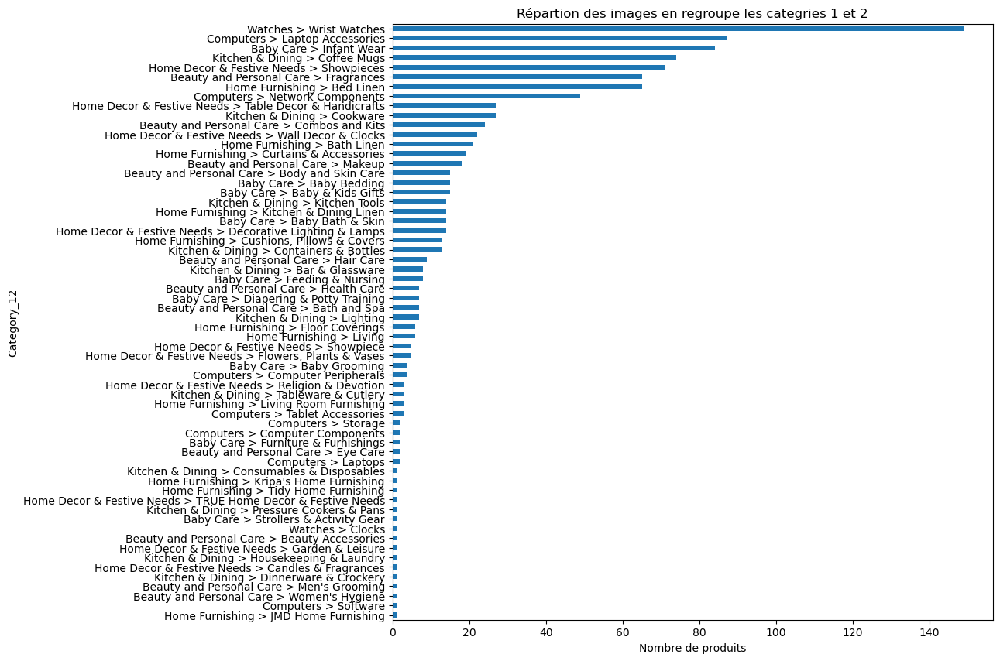

----------------------------------------------------------------------------------------------------
Visualisation de la répartition des images par category_1: 


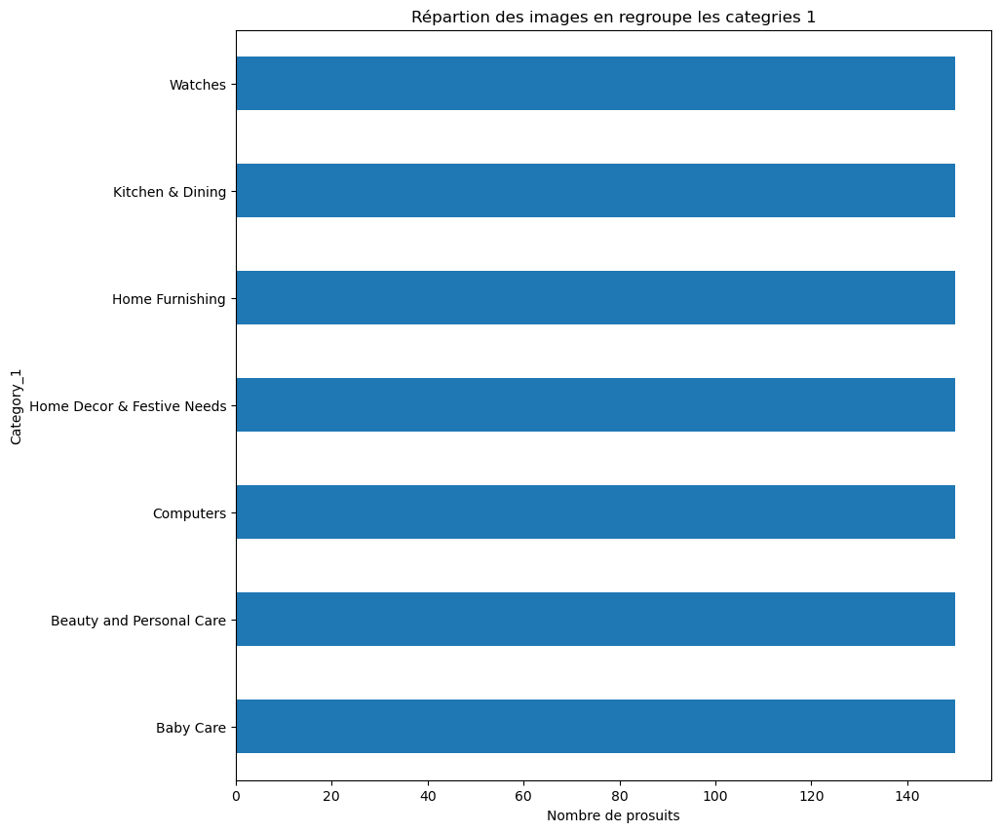

In [35]:
# Visualisation de la répartion des images et des description par categorie : 
data['product_name']
print('--'*50)
##################################################################################
print(f"Visualisation de la répartition des images par category_12 : ")

# graph_1 -> Répartion des images par category_12 : 
plt.figure(figsize=(10,10))
data.groupby('category_12')['product_name'].size().sort_values().plot(kind='barh')
plt.ylabel('Category_12')
plt.xlabel("Nombre de produits")
plt.title('Répartion des images en regroupe les categries 1 et 2')
plt.show()

print('--'*50)
##################################################################################
print(f"Visualisation de la répartition des images par category_1: ")

# graph_2 -> Répartion des images par category_1 : 
plt.figure(figsize=(10,10))
data.groupby('category_1')['product_name'].size().plot(kind='barh')
plt.ylabel('Category_1')
plt.xlabel("Nombre de prosuits")
plt.title('Répartion des images en regroupe les categries 1')
plt.show()

Au vu de la répartition des images, nous ne garderons que les category_1 comme categorie principale.

In [52]:
# Suppression de catgory_12 et renommage de catgory_1 
data = data.drop('category_12', axis=1)
data = data.rename(columns={'category_1' : 'category_cleaned'})

data.head()

,product_name,description,image,product_category_tree,category_cleaned
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Curtains & Accessories >>...",Home Furnishing
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Baby Care
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Baby Care
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Home Furnishing
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Home Furnishing


### 5.2. <a id='toc5_2_'></a>[Variable description](#toc0_)
#### 5.2.1. <a id='toc5_2_1_'></a>[Recherche de la meilleure Tokenization](#toc0_)

In [53]:
# Création des stop_words en anglais : 
stop_words_eng = set(stopwords.words('english'))

In [54]:
# Sélection de 10 descirptions au hasard : 

docs = []
i = 0 
while i < 10 :
     docs.append(data['description'].sample(1).values[0].lower())
     i += 1
display(docs)

del i 

['perucci pc-122 decker analog watch  - for men - buy perucci pc-122 decker analog watch  - for men  pc-122 online at rs.290 in india only at flipkart.com. beautifull watches, comfortable watches, fancy watche, stylish watches - great discounts, only genuine products, 30 day replacement guarantee, free shipping. cash on delivery!',
 'buy hp 15-ac121tu (notebook) (core i3 (5th gen)/ 4gb/ 1tb/ win10) (n8m17pa) online for rs.35390 , also get hp 15-ac121tu (notebook) (core i3 (5th gen)/ 4gb/ 1tb/ win10) (n8m17pa) specifications & features. only genuine products. 30 day replacement guarantee. free shipping. cash on delivery!',
 'arabian nights soex cranberry assorted hookah flavor (500 g)\r\n                         price: rs. 800\r\n\t\t\t\t\r\n\t\t\tan excellent cranberry taste that overwhelms sweetness everytime you have it.\r\nan excellent cranberry taste that overwhelms sweetness everytime you have it.',
 'perucci pc-303 analog watch  - for men - buy perucci pc-303 analog watch  - for 

In [55]:
# Test des différents tokenizers : 

for i, doc in enumerate(docs): 
    
    print('**'*50)
    print(f'---> doc_{i}\n')

    # Test du  tokenizer word_tokenize et filtrage des stops_words :
    print('Résultat avec word_tokenizer : \n')
    token = word_tokenize(doc)
    token = [w for w in token if w not in stop_words_eng]
    fct_NLP.tokens_info(token)
    
    # Test du  wordpunct_tokenize et filtrage des stops_words :
    print('--'*20)
    print('Résultat avec wordpunct_tokenize : \n')
    token = wordpunct_tokenize(doc)
    token = [w for w in token if w not in stop_words_eng]
    fct_NLP.tokens_info(token)
    
    # Test du  wordpunct_tokenize et filtrage des stops_words :
    print('--'*20)
    print('Résultat avec RegexpTokenizer : \n')
    token = RegexpTokenizer(r'\w+').tokenize(doc)  
    token = [w for w in token if w not in stop_words_eng]
    fct_NLP.tokens_info(token)
    

del doc, i, token, docs

****************************************************************************************************
---> doc_0

Résultat avec word_tokenizer : 

nb tokens 51, nb tokens uniques 33
----------------------------------------
Résultat avec wordpunct_tokenize : 

nb tokens 61, nb tokens uniques 36
----------------------------------------
Résultat avec RegexpTokenizer : 

nb tokens 43, nb tokens uniques 32
****************************************************************************************************
---> doc_1

Résultat avec word_tokenizer : 

nb tokens 64, nb tokens uniques 35
----------------------------------------
Résultat avec wordpunct_tokenize : 

nb tokens 72, nb tokens uniques 39
----------------------------------------
Résultat avec RegexpTokenizer : 

nb tokens 42, nb tokens uniques 30
****************************************************************************************************
---> doc_2

Résultat avec word_tokenizer : 

nb tokens 30, nb tokens uniques 21
-----------

Le Tokenizer RegexpTokenizer est celui qui réduit le mieux nos différentes chaines de caractères 

    --> Choix de RegexpTokenizer pour la suite de l'étude. 

#### 5.2.2. <a id='toc5_2_2_'></a>[Création d'une liste de stop_words personalisée ](#toc0_)

In [56]:
# Création du corpus sur la colonne descritpion : 

corpus = " ".join(data['description'].values)
print(f"Logueur du corpus total avant traitement : {len(corpus)}\n")

print("Après traitement Tokenization et enlèvement des stop_word_eng : ")
token = corpus.lower().strip()
token = RegexpTokenizer(r'\w+').tokenize(token)  
token = [w for w in token if w not in stop_words_eng]
fct_NLP.tokens_info(token)


Logueur du corpus total avant traitement : 498561

Après traitement Tokenization et enlèvement des stop_word_eng : 
nb tokens 61786, nb tokens uniques 5966


In [57]:
# Création d'un DataFrame df_freq_corpus contenant l'ensemble des mot unique du corpus description après traitement : 

# Création de la liste de mots unique dans le corpus : 
ls_mots = [x for x in set(token)]

# Création d'un dictionnaire pour le stockage des résultats : 
dict = {}

for w in ls_mots:
    
    # Calcul du nbre d'apparition et de la fréquence d'apparition de chaque mot : 
    dict[w] = {
        'Apparition': token.count(w),
        '%_Freq': ((token.count(w) /len(ls_mots))*100),
    }
    
# Création du DataFrame : 
df_freq_corpus = pd.DataFrame(dict)

# Mise en forme : 
df_freq_corpus = df_freq_corpus.T.sort_values('Apparition', ascending=False)
df_freq_corpus = df_freq_corpus.reset_index()
df_freq_corpus = df_freq_corpus.rename(columns={'index' : 'Mots'})

# Affichage : 
display(df_freq_corpus)

del dict, ls_mots, w

,Mots,Apparition,%_Freq
0,rs,911.0,15.269863
1,products,631.0,10.576601
2,free,618.0,10.358699
3,buy,581.0,9.738518
4,delivery,567.0,9.503855
...,...,...,...
5961,signature,1.0,0.016762
5962,n10e,1.0,0.016762
5963,error,1.0,0.016762
5964,victory,1.0,0.016762


In [58]:
# Visualisation de la répartition des mots dans le corpus :
df_freq_corpus.describe()

,Apparition,%_Freq
count,5966.000000,5966.000000
mean,10.356353,0.173590
std,39.975073,0.670048
min,1.000000,0.016762
25%,1.000000,0.016762
50%,2.000000,0.033523
75%,5.000000,0.083808
max,911.000000,15.269863


In [59]:
# Visualisation des mots du corpus les plus fréquent (%_freq > 5%):
df_freq_corpus[df_freq_corpus['%_Freq'] > 5]

,Mots,Apparition,%_Freq
0,rs,911.0,15.269863
1,products,631.0,10.576601
2,free,618.0,10.358699
3,buy,581.0,9.738518
4,delivery,567.0,9.503855
5,shipping,564.0,9.453570
6,genuine,564.0,9.453570
7,cash,564.0,9.453570
8,replacement,559.0,9.369762
9,1,554.0,9.285954


Ici, les 20 premiers mots les plus fréquents dans le corpus ne sont pas assez précis pour définir la catégorie 
        
        -> Suppression des 20 mots les plus fréquents.         

De la même manière les mots étant le mois présent dans le corpus, ne seront pas assez précis pour définir la catégorie de l'article. 

        -> Suppression des mots dont l'apparition est égale à 1. 

In [60]:
# Création de le liste de stop_words personalisée : 

# Ajout des 20 premiers mots les plus fréquents :
stop_words_perso = df_freq_corpus['Mots'].head(20).values.tolist()

# Ajout à la liste des mots présents qu'une seule fois :  
stop_words_perso = stop_words_perso + df_freq_corpus.loc[df_freq_corpus['Apparition'] == 1 , 'Mots'].values.tolist()

# Ajout des mots de la liste stop_words initiale : 
stop_words_perso = stop_words_perso + list(stop_words_eng)

# Affichage : 
print(f"Nombre de mots total dans la liste stop_words_perso : {len(stop_words_perso)}")

del df_freq_corpus, token

Nombre de mots total dans la liste stop_words_perso : 2139


#### 5.2.3. <a id='toc5_2_3_'></a>[Automatisation du nettoyage](#toc0_)
A ce stade, nous avons identifé : 
- le meilleur Tokenizer pour notre étude : RegexpTokenizer(r'\w+)
- la liste des mots à supprimer : stop_wors_perso (comprenant les stop_words anglais + les mots spécifiques de la variable description identifés)  

Le but étant d'utiliser plusieurs méthode d'extraction de features :  
| Méthode d'extraction |Besoin de Nettoyage |
|-|-|
|*BoW - CounterVecotrizer*|Complet|
|*Bow - Tfidf*|Complet|
|*Word2Vec* ou *GloVe* ou *FastText*|Uniquement une Tokenisation (avec ou sans stop_words)|
|*BERT*|Pas de Nettoyage|
|*USE*|Pas de Nettoyage|  

    A ce stade, nous pouvons donc utiliser la fonction clean_process_text nous permettant de personnaliser pour chaque modèles le niveau de nettoyage necessaire des descirptions. 

##### 5.2.3.1. <a id='toc5_2_3_1_'></a>[Création des différents prétraitement de la variables description](#toc0_)

In [61]:
# Création des variables dans data : 

# 1. Variable desc_cleaned_lem : 
data['desc_cleaned_lem'] = data['description'].apply(
    fct_NLP.clean_process_text,
    stop_words=stop_words_perso,
    min_len_word=3,
    alpha='y',
    lemm_or_stemm='lem',
    join=True,
    )

# 2. Variable desc_cleaned_stem : 
data['desc_cleaned_stem'] = data['description'].apply(
    fct_NLP.clean_process_text,
    stop_words=stop_words_perso,
    min_len_word=3,
    alpha='y',
    lemm_or_stemm='stem',
    join=True,
    )

# 3. Variable desc_tokenize_without_sw : 
data['desc_tokenize_without_sw'] = data['description'].apply(
    fct_NLP.clean_process_text,
    stop_words=stop_words_perso,
    min_len_word=None,
    alpha='n',
    lemm_or_stemm=None,
    join=False,
    )

# 4. Variable desc_tokenize : 
data['desc_tokenize'] = data['description'].apply(
    fct_NLP.clean_process_text,
    stop_words=None,
    min_len_word=None,
    alpha='n',
    lemm_or_stemm=None,
    join=False,
    )

# 5. Affichage de data : 
data = data.drop('product_category_tree', axis=1)
data

,product_name,description,image,category_cleaned,desc_cleaned_lem,desc_cleaned_stem,desc_tokenize_without_sw,desc_tokenize
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,key elegance polyester multicolor abstract eye...,key eleg polyest multicolor abstract eyelet do...,"[key, elegance, polyester, multicolor, abstrac...","[key, features, of, elegance, polyester, multi..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,sathiyas cotton bath towel bath towel red yell...,sathiya cotton bath towel bath towel red yello...,"[sathiyas, cotton, bath, towel, 3, bath, towel...","[specifications, of, sathiyas, cotton, bath, t..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,key eurospa cotton terry face towel set size s...,key eurospa cotton terri face towel set size s...,"[key, eurospa, cotton, terry, face, towel, set...","[key, features, of, eurospa, cotton, terry, fa..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing,key santosh royal fashion cotton printed king ...,key santosh royal fashion cotton print king si...,"[key, santosh, royal, fashion, cotton, printed...","[key, features, of, santosh, royal, fashion, c..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing,key jaipur print cotton floral king sized doub...,key jaipur print cotton floral king size doubl...,"[key, jaipur, print, cotton, floral, king, siz...","[key, features, of, jaipur, print, cotton, flo..."
...,...,...,...,...,...,...,...,...
1045,Oren Empower Extra Large Self Adhesive Sticker,Oren Empower Extra Large Self Adhesive Sticker...,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Baby Care,empower extra large self adhesive sticker pack...,empow extra larg self adhes sticker pack doubl...,"[empower, extra, large, self, adhesive, sticke...","[oren, empower, extra, large, self, adhesive, ..."
1046,Wallmantra Large Vinyl Sticker Sticker,Wallmantra Large Vinyl Sticker Sticker (Pack o...,fd6cbcc22efb6b761bd564c28928483c.jpg,Baby Care,wallmantra large vinyl sticker sticker pack br...,wallmantra larg vinyl sticker sticker pack bri...,"[wallmantra, large, vinyl, sticker, sticker, p...","[wallmantra, large, vinyl, sticker, sticker, p..."
1047,Uberlyfe Extra Large Pigmented Polyvinyl Films...,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,5912e037d12774bb73a2048f35a00009.jpg,Baby Care,uberlyfe extra large pigmented polyvinyl film ...,uberlyf extra larg pigment polyvinyl film impo...,"[uberlyfe, extra, large, pigmented, polyvinyl,...","[buy, uberlyfe, extra, large, pigmented, polyv..."
1048,Wallmantra Medium Vinyl Sticker Sticker,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Baby Care,wallmantra medium vinyl sticker sticker wallma...,wallmantra medium vinyl sticker sticker wallma...,"[wallmantra, medium, vinyl, sticker, sticker, ...","[buy, wallmantra, medium, vinyl, sticker, stic..."


### 5.3. <a id='toc5_3_'></a>[Enregistrement des données](#toc0_)

In [62]:
# Enregistrement de data, data_base et stop_words_perso :

fct_data.enregistrement_pickle(
    name='data_base',
    chemin='2. Sauvegardes',
    fichier=data_base,
)

fct_data.enregistrement_pickle(
    name='stop_words_perso',
    chemin='2. Sauvegardes/1. NLP',
    fichier=stop_words_perso,
)

fct_data.enregistrement_pickle(
    name='data_pretraite_NLP',
    chemin='2. Sauvegardes/1. NLP',
    fichier=data,
)

### 5.4. <a id='toc5_4_'></a>[Visualisation](#toc0_)

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Home Furnishing

Descriptions nettoyés avec Lemmatizer : 


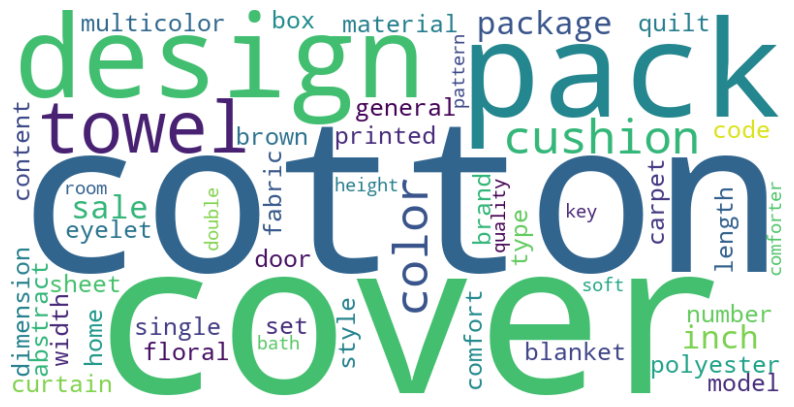

Descriptions nettoyés avec Stemmer : 


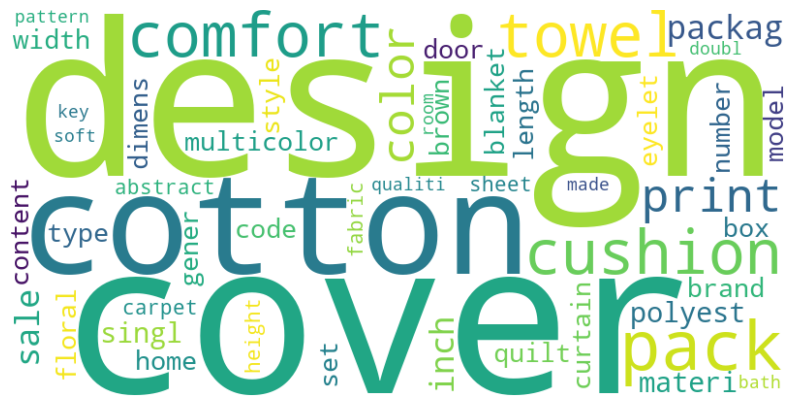

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Baby Care

Descriptions nettoyés avec Lemmatizer : 


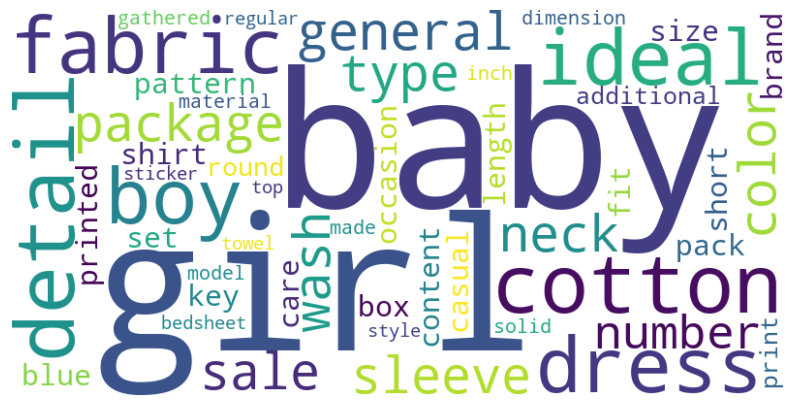

Descriptions nettoyés avec Stemmer : 


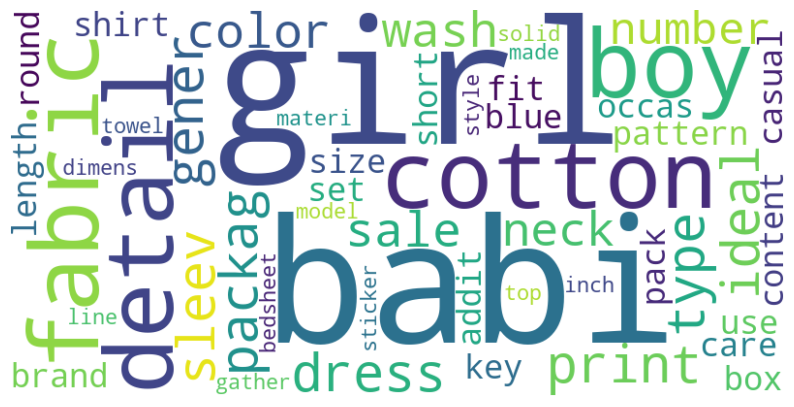

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Watches

Descriptions nettoyés avec Lemmatizer : 


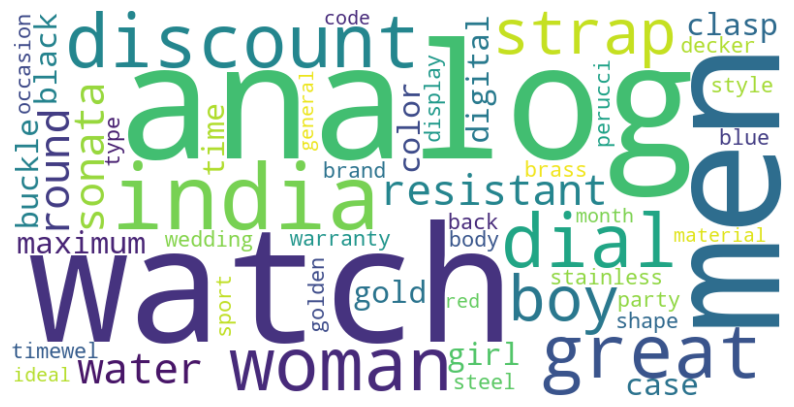

Descriptions nettoyés avec Stemmer : 


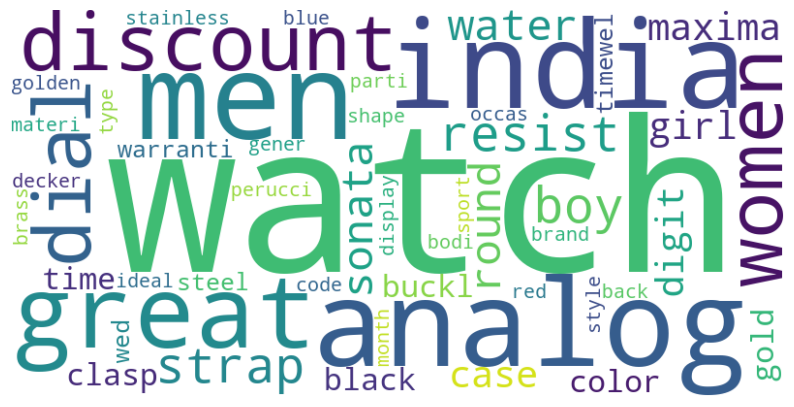

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Home Decor & Festive Needs

Descriptions nettoyés avec Lemmatizer : 


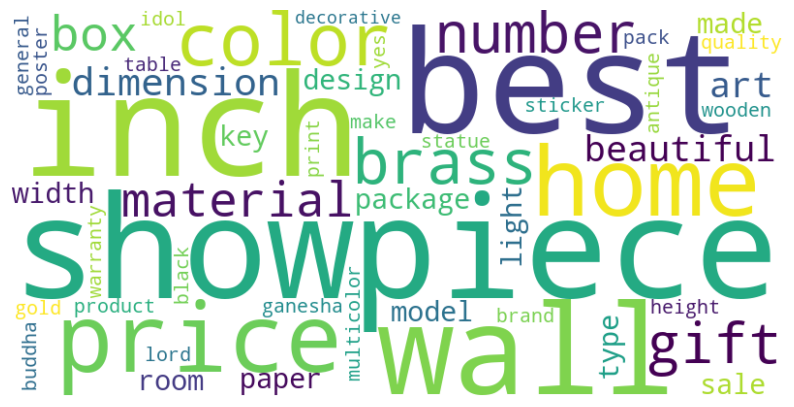

Descriptions nettoyés avec Stemmer : 


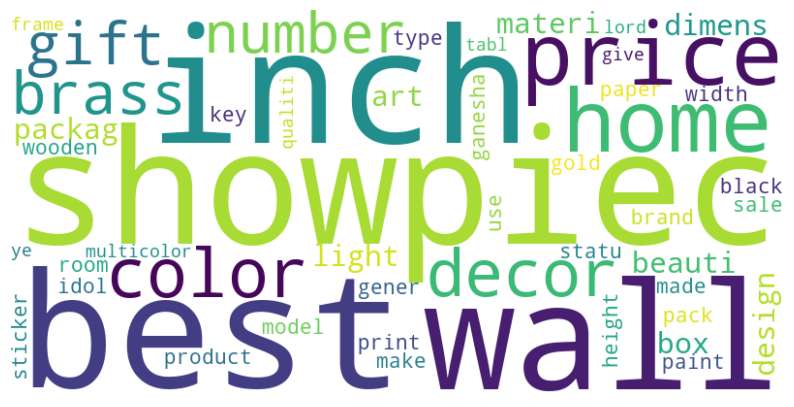

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Kitchen & Dining

Descriptions nettoyés avec Lemmatizer : 


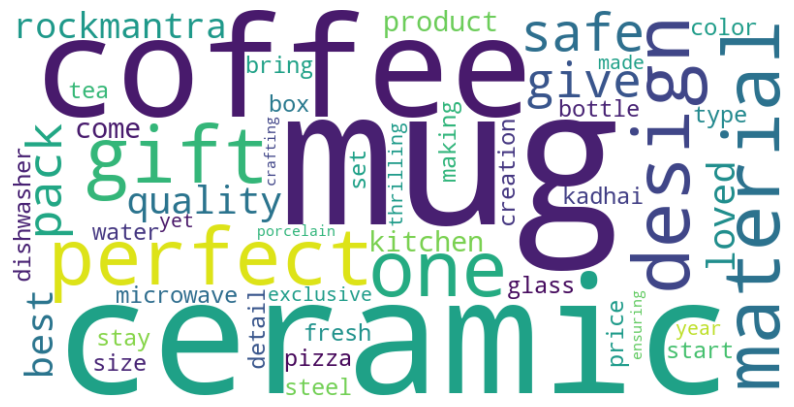

Descriptions nettoyés avec Stemmer : 


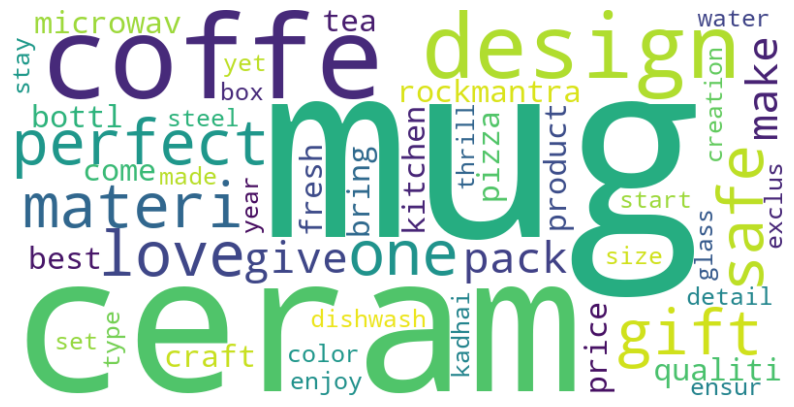

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Beauty and Personal Care

Descriptions nettoyés avec Lemmatizer : 


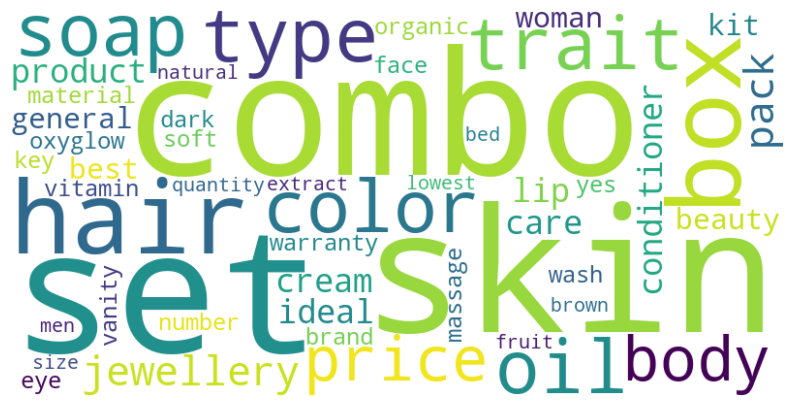

Descriptions nettoyés avec Stemmer : 


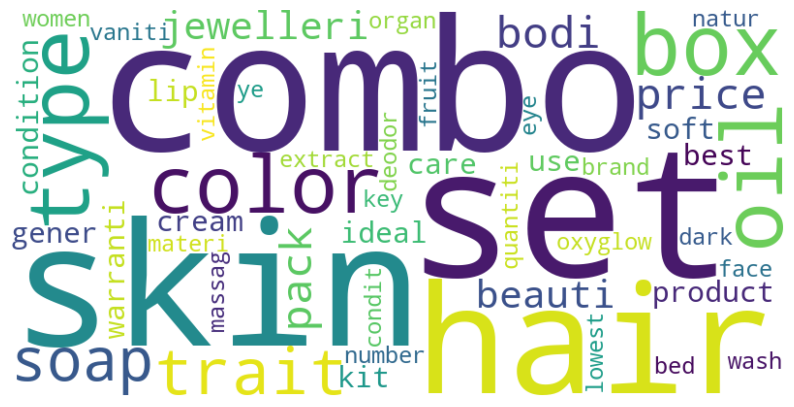

----------------------------------------------------------------------------------------------------
Nuage de mots pour la catégorie : Computers

Descriptions nettoyés avec Lemmatizer : 


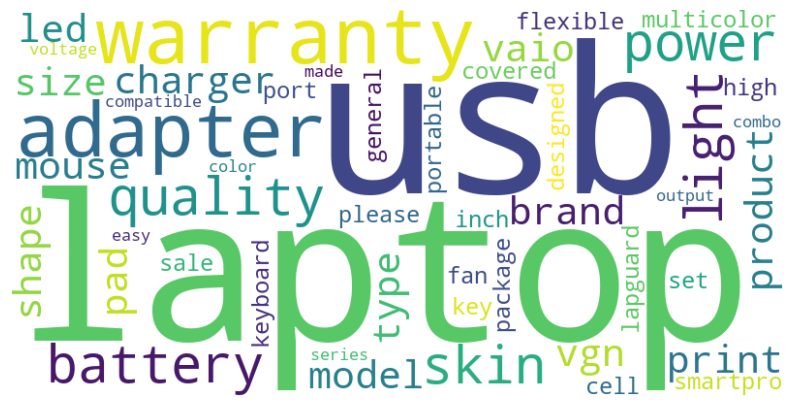

Descriptions nettoyés avec Stemmer : 


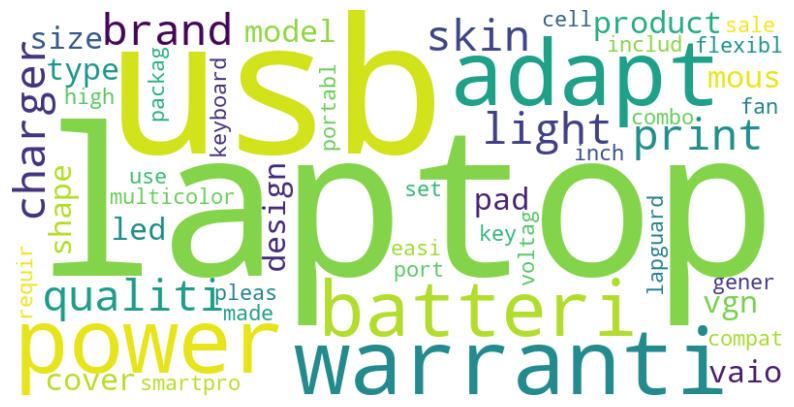

In [63]:
# Visualisation des 50 mots les plus fréquents des descriptions de chaque catégorie  : 

for cat in data['category_cleaned'].unique(): 
    
    # Filtre sur data : 
    data_category = data[data['category_cleaned'] == cat]
    
    # 1.Description nettoyé avec Lemmatizer :
    #########################################################################################
    # Concaténation de l'ensemble des description de la catégorie : 
    description_lem = ' '.join(data_category['desc_cleaned_lem'])
    
    # Comptage des mots : 
    description_lem = Counter(description_lem.split())
    
    # Sélection des 50 mots les plus courants : 
    description_50_lem = [w for w, count in description_lem.most_common(50)]
    description_50_lem = ' '.join(description_50_lem)
    
    # Création du nuage de mots : 
    wordcloud_lem = WordCloud(width=800, height=400, background_color='white').generate(description_50_lem)
    #########################################################################################


    # 2.Description nettoyé avec Stemmer :
    #########################################################################################
    # Concaténation de l'ensemble des description de la catégorie : 
    description_stem = ' '.join(data_category['desc_cleaned_stem'])
    
    # Comptage des mots : 
    description_stem = Counter(description_stem.split())
    
    # Sélection des 50 mots les plus courants : 
    description_50_stem = [w for w, count in description_stem.most_common(50)]
    description_50_stem = ' '.join(description_50_stem)
    
    # Création du nuage de mots : 
    wordcloud_stem = WordCloud(width=800, height=400, background_color='white').generate(description_50_stem)
    #########################################################################################


    # 3. Affichage de la figure : 
    print('--'*50) 
    print(f"Nuage de mots pour la catégorie : {cat}\n")
    print(f"Descriptions nettoyés avec Lemmatizer : ")
    
    plt.figure(figsize=(10,8))
    plt.imshow(wordcloud_lem, interpolation='bilinear')
    plt.axis('off')
    plt.show()

    print(f"Descriptions nettoyés avec Stemmer : ")
    
    plt.figure(figsize=(10,8))
    plt.imshow(wordcloud_stem, interpolation='bilinear')
    plt.axis('off')
    plt.show()

del cat, data_category
del description_50_lem, wordcloud_lem, description_lem
del description_50_stem, wordcloud_stem, description_stem

In [64]:
# Création d'un DataFrame réperoriant la fréquence des 50 mots les plus courant des descriptions de data au sein de chaque catégorie : 


# 1.Description nettoyé avec Lemmatizer :
######################################################################################### 
# Concaténation de l'ensemble des description de la catégorie : 
description_lem = ' '.join(data['desc_cleaned_lem'])
    
# Comptage des mots : 
description_lem = Counter(description_lem.split())
    
# Sélection des 50 mots les plus courants : 
description_50_lem = [w for w, count in description_lem.most_common(50)]

# Création du dictionnaire  de stockage des fréquences de mots de chaque catégorie : 
freq_dists_lem = {}
######################################################################################### 


# 2.Description nettoyé avec Stemmer :
######################################################################################### 
# Concaténation de l'ensemble des description de la catégorie : 
description_stem = ' '.join(data['desc_cleaned_stem'])
    
# Comptage des mots : 
description_stem = Counter(description_stem.split())
    
# Sélection des 50 mots les plus courants : 
description_50_stem = [w for w, count in description_stem.most_common(50)]

# Création du dictionnaire  de stockage des fréquences de mots de chaque catégorie : 
freq_dists_stem = {}
#########################################################################################

# 3. Calcul des fréquences : 
for cat in data['category_cleaned'].unique():
    df = data[data['category_cleaned'] == cat]
    
    text_lem = ' '.join(df['desc_cleaned_lem'])
    freq_dists_lem[cat] = FreqDist(word_tokenize(text_lem))
    
    text_stem = ' '.join(df['desc_cleaned_stem'])
    freq_dists_stem[cat] = FreqDist(word_tokenize(text_stem))   
    
# 4. Création des dictionnaires de stockage des fréquences des mots de description_50 pour chaque catégorie : 
word_50_frequencies_lem = {}
word_50_frequencies_stem = {}

for word in description_50_lem: 
    word_50_frequencies_lem[word] = {}
    for cat, fdist in freq_dists_lem.items():
        word_50_frequencies_lem[word][cat] = fdist[word]
        
for word in description_50_stem: 
    word_50_frequencies_stem[word] = {}
    for cat, fdist in freq_dists_stem.items():
        word_50_frequencies_stem[word][cat] = fdist[word]
        
# 5. Création des DataFrames avec les résultats : 
df_freq_top_50_words_lem = pd.DataFrame(word_50_frequencies_lem).T.sort_index()
df_freq_top_50_words_stem = pd.DataFrame(word_50_frequencies_stem).T.sort_index()

# 6. Affichage : 
print("DataFrame de le fréquence des 50 mots les plus courant de l'ensemble de data au sein de chaque catégorie :\n")
print(f"Avec Lemmatizer : ")
display(df_freq_top_50_words_lem)
print('--'*50)
print(f"Avec Stemmer : ")
display(df_freq_top_50_words_stem)

del description_lem, description_50_lem, freq_dists_lem, text_lem, word_50_frequencies_lem
del description_stem, description_50_stem, freq_dists_stem, text_stem, word_50_frequencies_stem
del cat, df, word, fdist

DataFrame de le fréquence des 50 mots les plus courant de l'ensemble de data au sein de chaque catégorie :

Avec Lemmatizer : 


,Home Furnishing,Baby Care,Watches,Home Decor & Festive Needs,Kitchen & Dining,Beauty and Personal Care,Computers
analog,0,0,256,6,0,0,0
baby,2,316,0,1,0,1,0
best,5,21,0,87,65,25,27
box,46,67,7,51,46,52,28
boy,0,112,67,0,1,4,0
brand,47,41,10,32,30,17,61
ceramic,0,2,1,10,206,0,0
coffee,1,2,0,0,161,0,0
color,66,81,29,71,51,42,29
combo,0,5,0,4,1,107,31


----------------------------------------------------------------------------------------------------
Avec Stemmer : 


,Home Furnishing,Baby Care,Watches,Home Decor & Festive Needs,Kitchen & Dining,Beauty and Personal Care,Computers
analog,0,0,256,6,0,0,0
babi,2,316,0,1,0,1,0
best,5,21,0,87,65,25,27
box,46,67,7,51,46,52,28
boy,0,112,67,0,1,4,0
brand,50,47,10,32,30,17,61
ceram,0,2,1,10,206,0,0
coffe,1,2,0,0,161,0,0
color,66,83,29,76,52,43,29
content,42,74,1,13,3,14,12


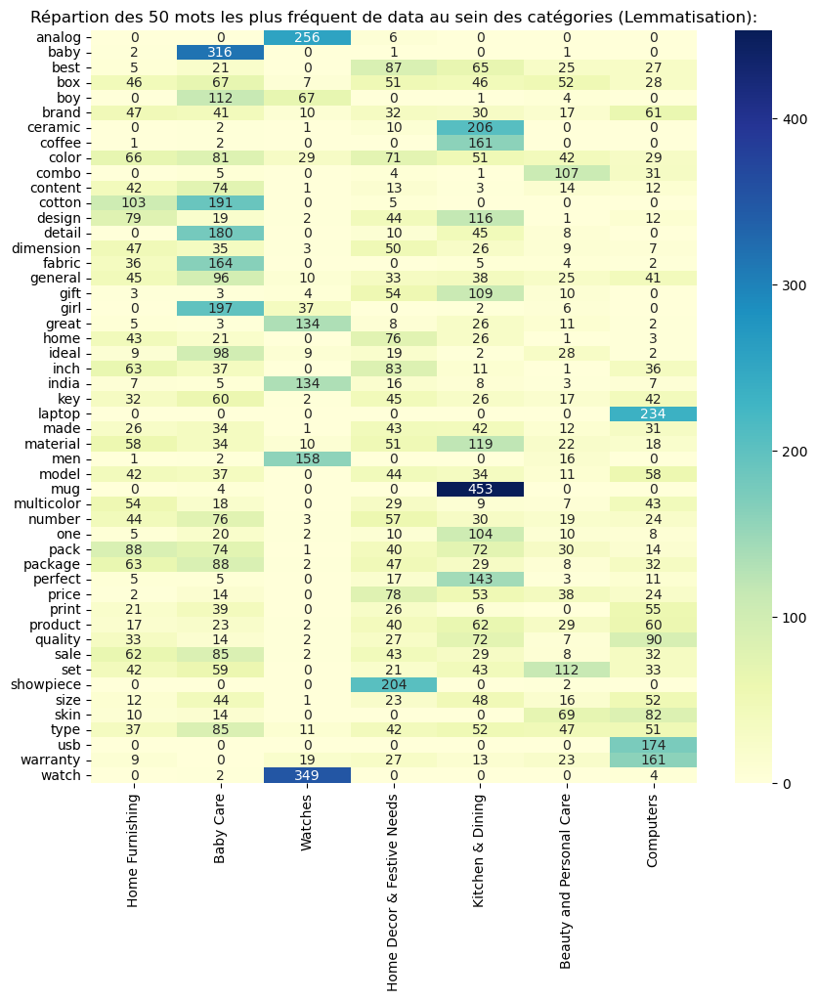

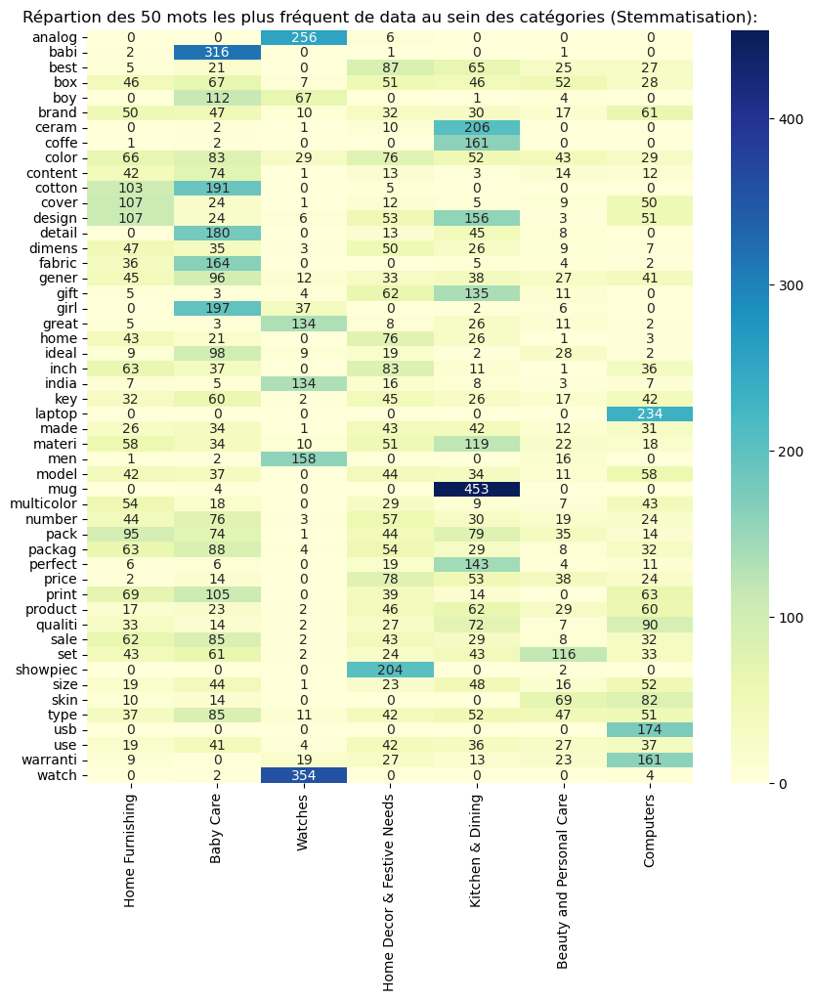

In [65]:
# Visualisation graphique : 

# Graphe_1 - avec Lematisation :
 
plt.figure(figsize=(10, 10))
sns.heatmap(df_freq_top_50_words_lem, cmap="YlGnBu", annot=True, fmt='g')
plt.title('Répartion des 50 mots les plus fréquent de data au sein des catégories (Lemmatisation):')
plt.show()

# Graphe_2 - avec Stemmatisation  : 
plt.figure(figsize=(10, 10))
sns.heatmap(df_freq_top_50_words_stem, annot=True, fmt='g', cmap="YlGnBu")
plt.title('Répartion des 50 mots les plus fréquent de data au sein des catégories (Stemmatisation):')
plt.show()

del df_freq_top_50_words_stem, df_freq_top_50_words_lem

## 6. <a id='toc6_'></a>[Classification non supervisée.](#toc0_)

Pour chaque modèle d'extraction de features à partir des données texutelles (descriptions): 
- Extraction de features à partir des différents nettoyages des descritpions. 
- Réduction en 2 dimensions à l'aide de TSNE (pour visualisation de la répartition des produits par catégories).
- Recherche en fonction de différentes perplexités de TSNE, les meilleurs hyperparamètres de KMeans fournissant le meileur clustering en comparaison des vraies catégories. (optimisation basée sur l'ARI)
- Calcul pour le meilleur KMeans et la meilleure perplecité, l'ARI, l'homogénéité, la complétude et la v-measure des clusters. (pour comparaison finale de la meilleures méthode d'extraction de features). 
- Visualisation des projections en 2 dimensions du clustering versus les catégories réelles. 

--> ARI (Adjusted Rand Index) : mesure de la similitude des clusters vis à vis des catégories réelles.  
--> Homogénéité : mesure à quel point chaque cluster contient principalement des produits d'une seule catégorie réelle.  
--> Complétude :  mesure à quel point tous les produits d'une même catégorie réelle sont regroupés dans le même cluster.  
--> V-measure : mesure combinée de l'homogénéité et de la complétude.

In [25]:
# Création d'un dictionnaire pour le stockage de l'ensemble des résultats : 
dict_desc_class_non_supervisée = {}

### 6.1. <a id='toc6_1_'></a>[Bags of words - CounterVecotrizer](#toc0_)
Ce modèle renvoie une matrice de comptage des tokens présents dans l'ensemble du corpus.  
Matrice de comptage --> composée d'une colonne par token et prends en valeur le nombre d'occurennce présent dans le texte (matrice principalement creuse).  
#### 6.1.1. <a id='toc6_1_1_'></a>[Descrptions Lemmatisées](#toc0_)

In [26]:
# Extraction de features : 

# Création due modèle d'extraction de features : 
model = CountVectorizer()

# Extraction : 
X = model.fit_transform(data['desc_cleaned_lem'])

# Cration d'un DataFrame pour le stockage des résultats : 
df = pd.DataFrame(X.toarray(),
                  columns=model.get_feature_names_out(),
                  )

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 3088)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


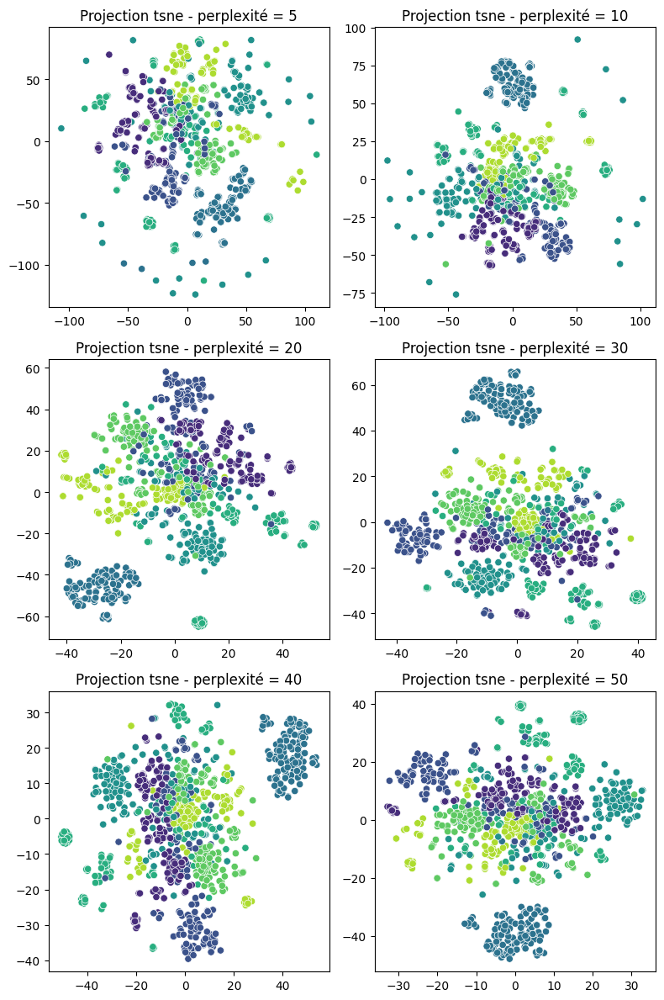

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 10
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
10,0.420166,337644.0,0.790313


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.4016
Homogénéité : 0.492453181568797
Complétude : 0.5131058873887103
V-measure : 0.5025674463623758
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
Bow - CounterVectorizer - Descritpions lemmatisées
----------------------------------------------------------------------------------------------------


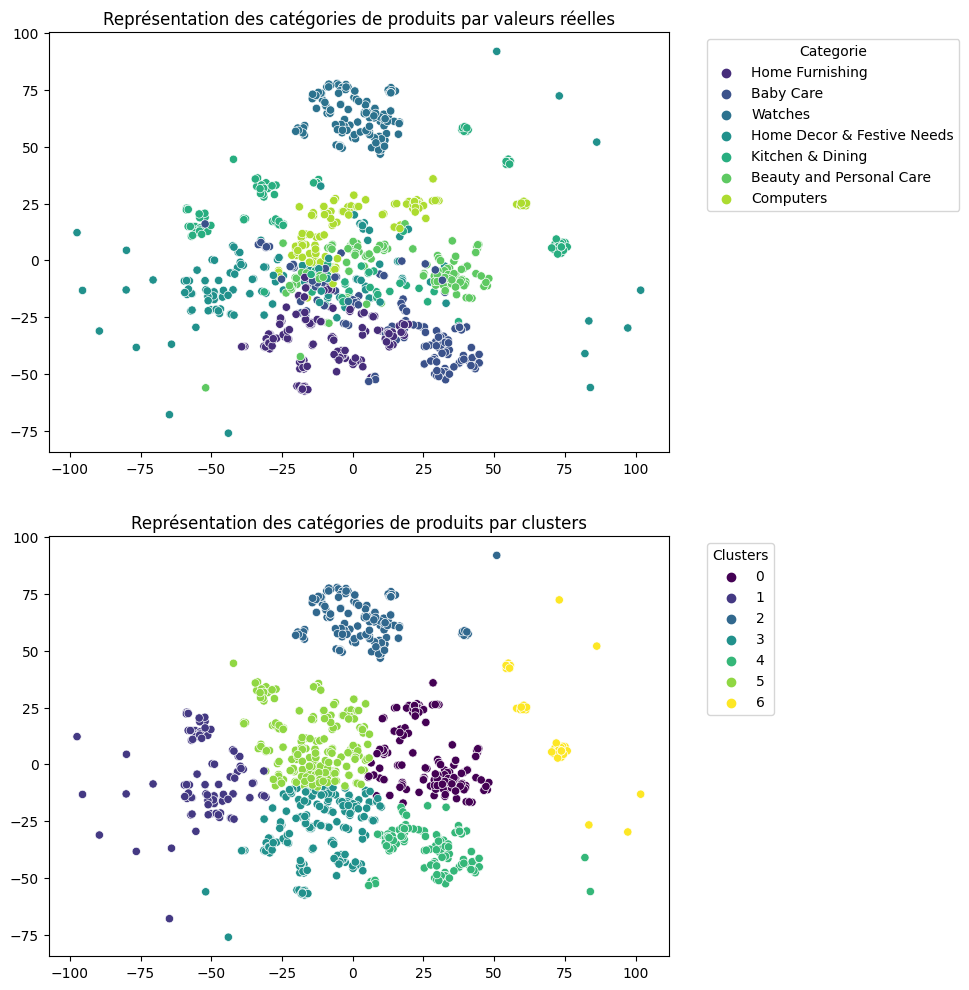

In [27]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
    features=X, 
    y_true=data['category_cleaned'],
    tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
    kmeans_clusters=data['category_cleaned'].nunique(),
    ls_ninit=[10, 20, 30, 50, 70, 80, 100],
    ls_maxiter=[100, 200, 300, 400, 500],
    title='Bow - CounterVectorizer - Descritpions lemmatisées',  
)

In [31]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['bow_CV_desc_cleaned_lem'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

del model, X, df, labels, kmeans_params, tsne_perplexity, dict_result

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
 )

#### 6.1.2. <a id='toc6_1_2_'></a>[Descriptions Stemmées](#toc0_)

In [32]:
# Extraction de features : 

# Création due modèle d'extraction de features : 
model = CountVectorizer()

# Extraction : 
X = model.fit_transform(data['desc_cleaned_stem'])

# Cration d'un DataFrame pour le stockage des résultats : 
df = pd.DataFrame(X.toarray(),
                  columns=model.get_feature_names_out(),
                  )

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 2740)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


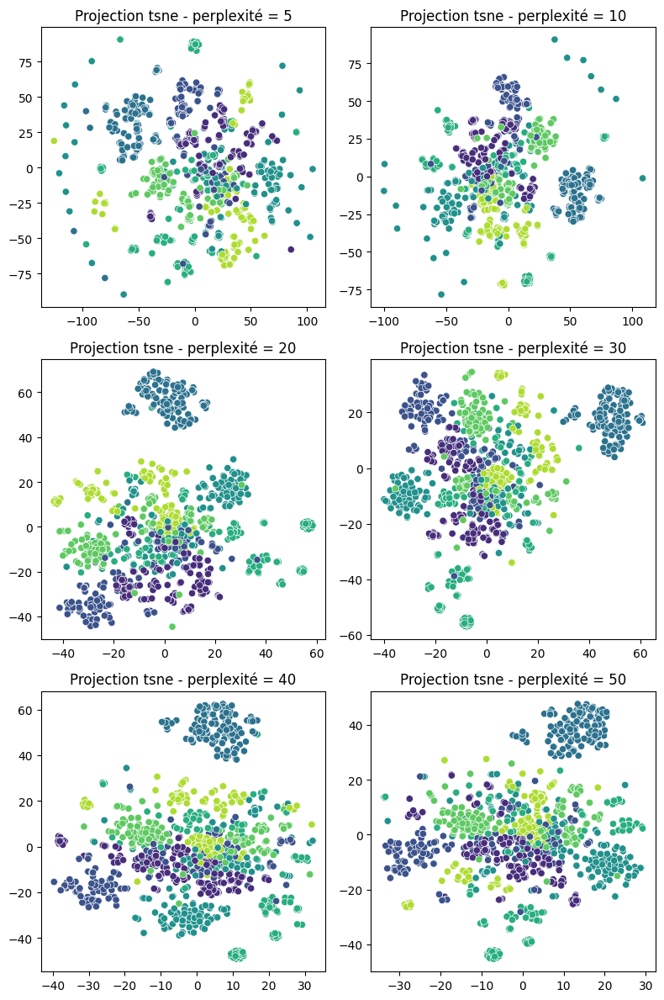

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 20
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.440433,156851.59375,0.762798


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.4022
Homogénéité : 0.4998793792654089
Complétude : 0.5087029089449574
V-measure : 0.504252548009993
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
Bow - CounterVectorizer - Descritpions Stemmées
----------------------------------------------------------------------------------------------------


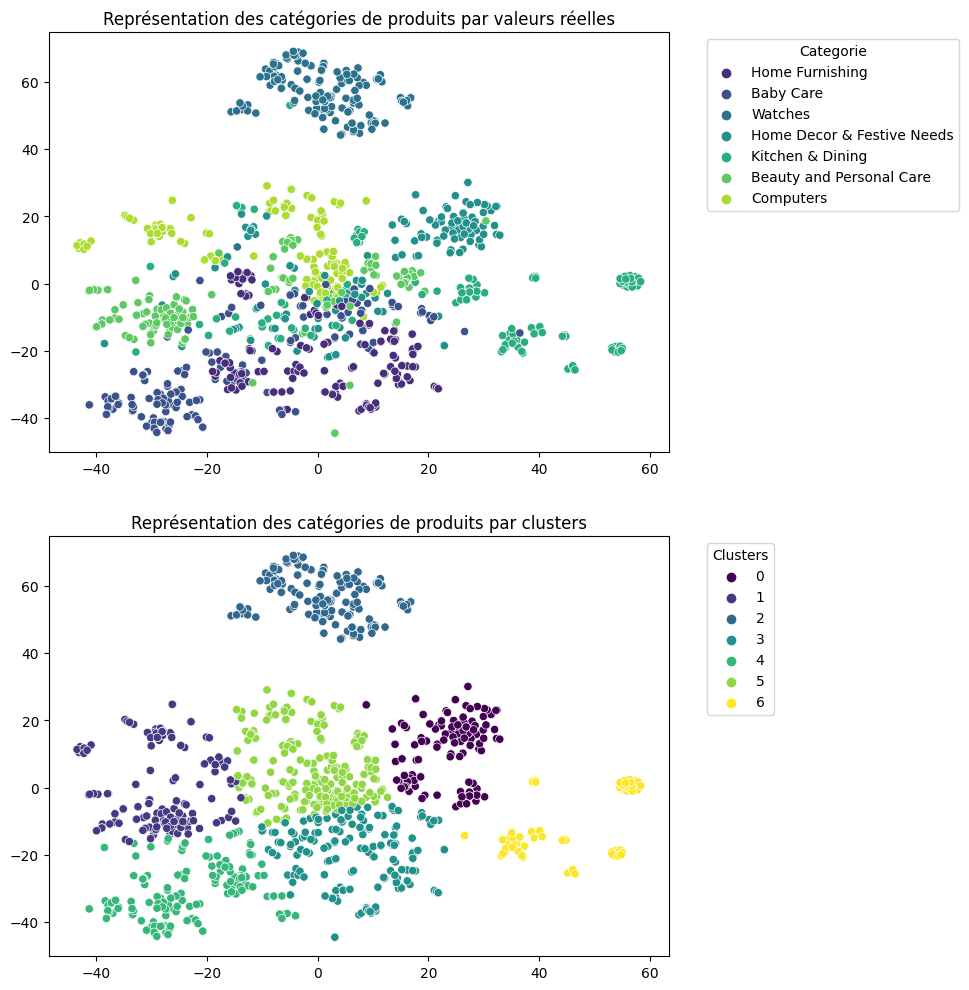

In [36]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X,
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='Bow - CounterVectorizer - Descritpions Stemmées',  
        )

In [37]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['bow_CV_desc_cleaned_stem'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

del model, X, df, labels, kmeans_params, tsne_perplexity, dict_result

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
 )

### 6.2. <a id='toc6_2_'></a>[Bags o words - TfidfVectorizer](#toc0_)
Le modèle Tfidf renvoie une matrice de fréquence des tokens présents dans l'ensemble du corpus.  

Tfidf étant le produit de deux termes : 
- Tf (Term Frequency) --> définie comme le nombre de fois qu'un token aparait dans un texte du corpus.
- idf (Inverse Document Frequency) --> défini comme le logarithme de la fraction entre le nombre total de texte dans le corpus et le nombre total de text contenant le token en question.

Matrice de fréquence --> composée d'une colonne par token et prends en valeur la fréquence (telle que définie précédement) sur le texte en question. (matrice principalement creuse).  

La pondération de ce modèle permets d'identifier les tokens spécifiques à un texte.
#### 6.2.1. <a id='toc6_2_1_'></a>[Description Lemmatisée](#toc0_)


In [38]:
# Extraction de features : 

# Création due modèle d'extraction de features : 
model = TfidfVectorizer()

# Extraction : 
X = model.fit_transform(data['desc_cleaned_lem'])

# Cration d'un DataFrame pour le stockage des résultats : 
df = pd.DataFrame(X.toarray(),
                  columns=model.get_feature_names_out(),
                  )

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 3088)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


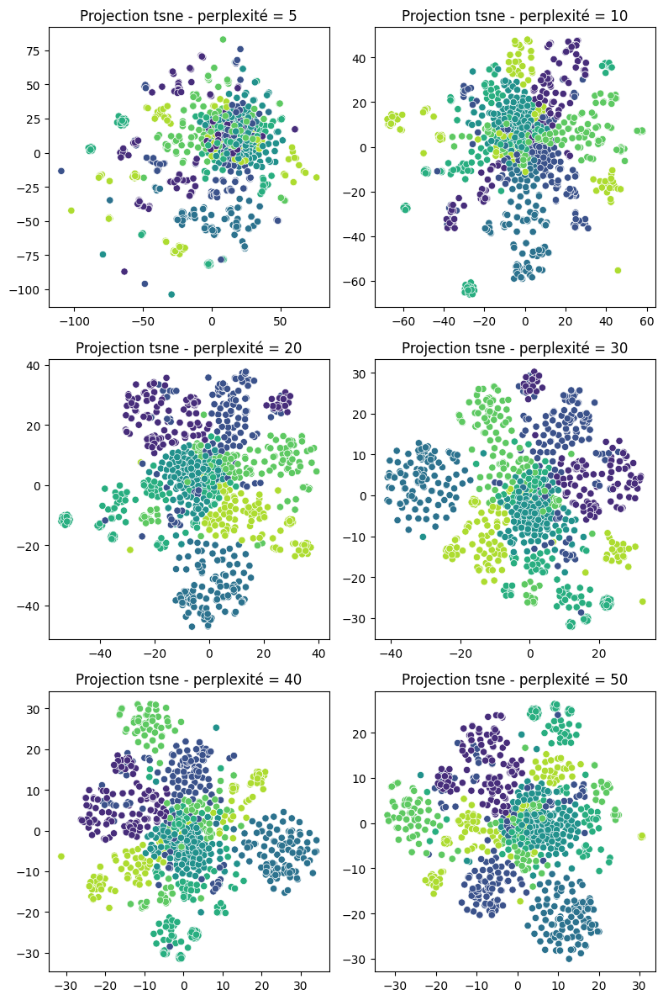

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 30
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.428309,73746.304688,0.746374


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.5276
Homogénéité : 0.601273200102527
Complétude : 0.6081941296155376
V-measure : 0.6047138630569716
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
Bow - TfidfVectorizer - Descritpions lemmatisées
----------------------------------------------------------------------------------------------------


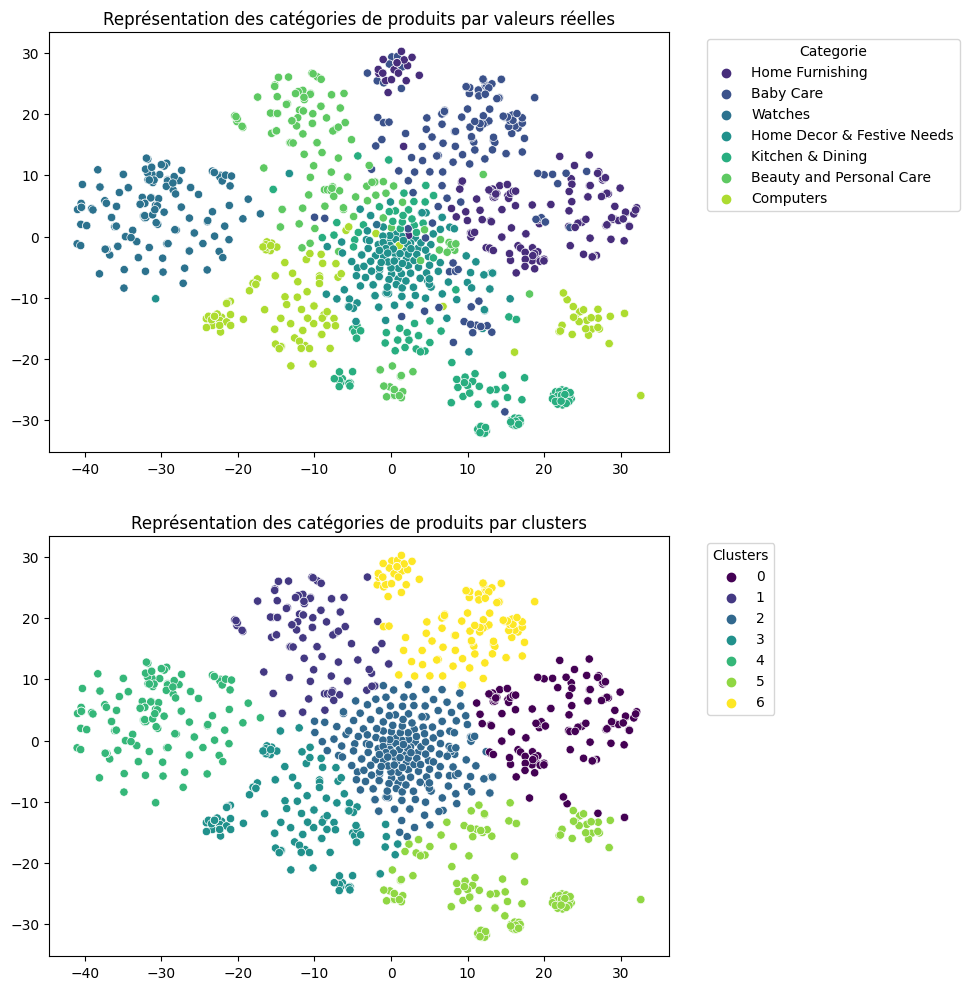

In [39]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='Bow - TfidfVectorizer - Descritpions lemmatisées',  
        )

In [40]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['bow_Tfidf_desc_cleaned_lem'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

del model, X, df, labels, kmeans_params, tsne_perplexity, dict_result

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
 )

#### 6.2.2. <a id='toc6_2_2_'></a>[Descriptions Stemmées](#toc0_)

In [41]:
# Extraction de features : 

# Création due modèle d'extraction de features : 
model = TfidfVectorizer()

# Extraction : 
X = model.fit_transform(data['desc_cleaned_stem'])

# Cration d'un DataFrame pour le stockage des résultats : 
df = pd.DataFrame(X.toarray(),
                  columns=model.get_feature_names_out(),
                  )

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 2740)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


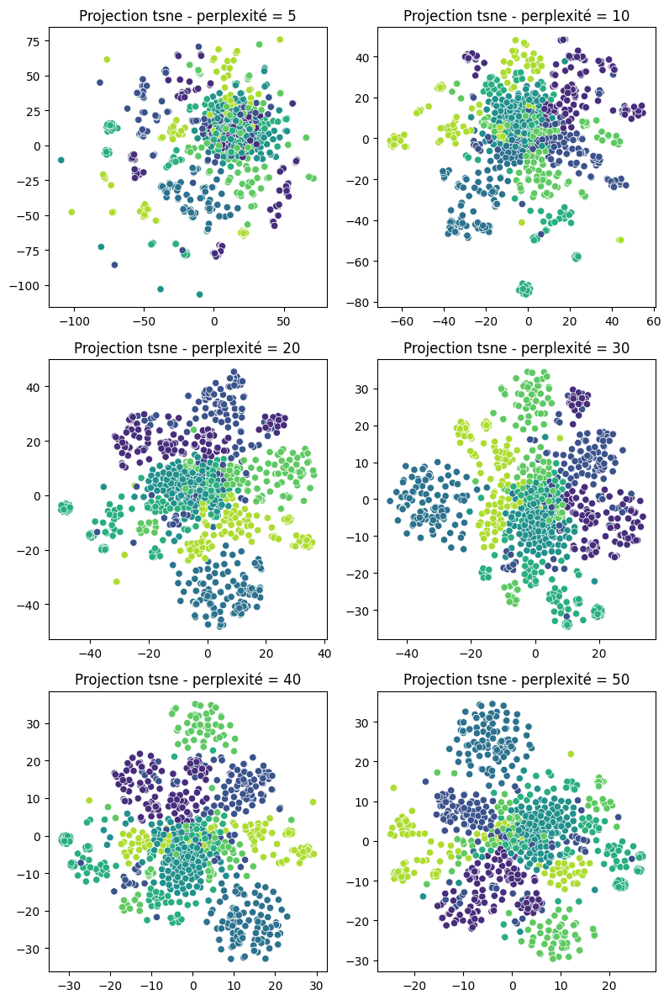

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 30
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
1,0.427266,80041.867188,0.755529


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.4745
Homogénéité : 0.5727141966790948
Complétude : 0.5889929669365763
V-measure : 0.5807395262310967
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
Bow - TfidfVectorizer - Descritpions Stemmées
----------------------------------------------------------------------------------------------------


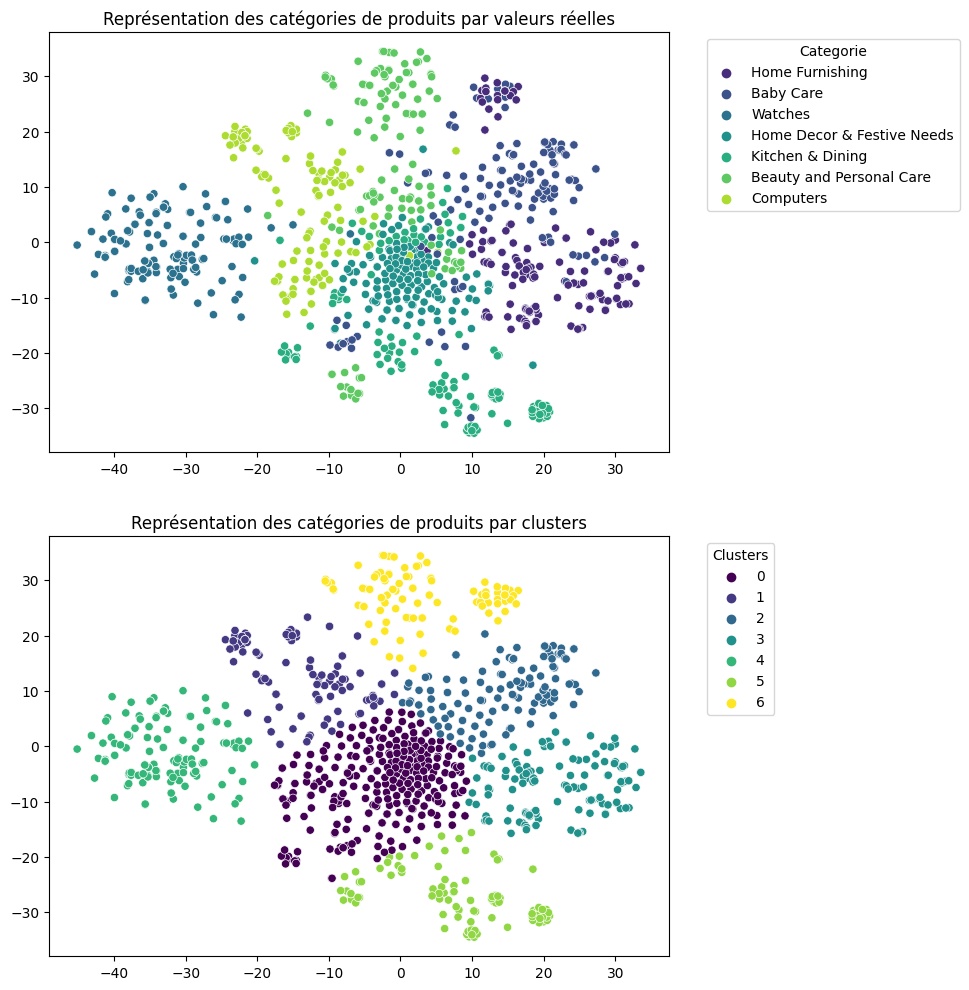

In [42]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='Bow - TfidfVectorizer - Descritpions Stemmées',
        )

In [43]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['bow_Tfidf_desc_cleaned_stem'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

del model, X, df, labels, kmeans_params, tsne_perplexity, dict_result

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
 )

### 6.3. <a id='toc6_3_'></a>[Word2Vec](#toc0_)
C'est une ensemble de modèles de réseaux de neurones (composés de 3 couches). 
Ces modèles permetent de convertir les mots en vecteurs numériques. Ces vecteurs étant proche en cas de similitude contextuelle des mots.

Cet ensemble est composé de deux modèles disctincts : 
- **CBOW (Continus Bag of Words)** : ce modèle tente de prédire un mot cible en se basant sur le contexte des mots voisins. 
- **Skip-gram** : A l'inverse, celui-ci tente la prédiction des mots voisins à partir d'un mot cible. 

*Hyperparamètres* :  
|||
|-|-|
|**vector_size**(int)|Taille des vecteurs pour chaque mot|
|**window**(int)|Distance maximale entre le mot actuel et le mot prédit dans une phrase|
|**min_count**(int)|Permets d'ignorer les mots dont la fréquence est inférieure à cette valeur|
|**sg**(bool)|Permet la sélection du type de modèle (0 pour CBOW ou 1 pour Skip-gramm)| 
|||

Ici, prendrons les hypermparamètres suivant : 
- vector_size = 300 (taille maximal du nombre de features par mot)
- window = 4 (prise en compte des 4 mots à gauche et droite de la cible)
- min_count = 3 (élimination des mots présents moins de 3 fois, simplification de la dimmensionnalité sans perdre en pertinence)
#### 6.3.1. <a id='toc6_3_1_'></a>[CBOW](#toc0_)
##### 6.3.1.1. <a id='toc6_3_1_1_'></a>[Description tokenisées avec les stop_words](#toc0_)


In [44]:
# Extraction de features : 

# Création du modèle : 
model = Word2Vec(
    sentences=data['desc_tokenize'],
    vector_size=300,
    window=4,
    min_count=3,
    sg=0,
)

# Calcul des vecteurs moyens pour chaque descriptions : 
df = fct_NLP.mean_embending_w2v_df(
    descriptions=data['desc_tokenize'].tolist(),
    word2vec_model=model,
    )

X = df.values

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


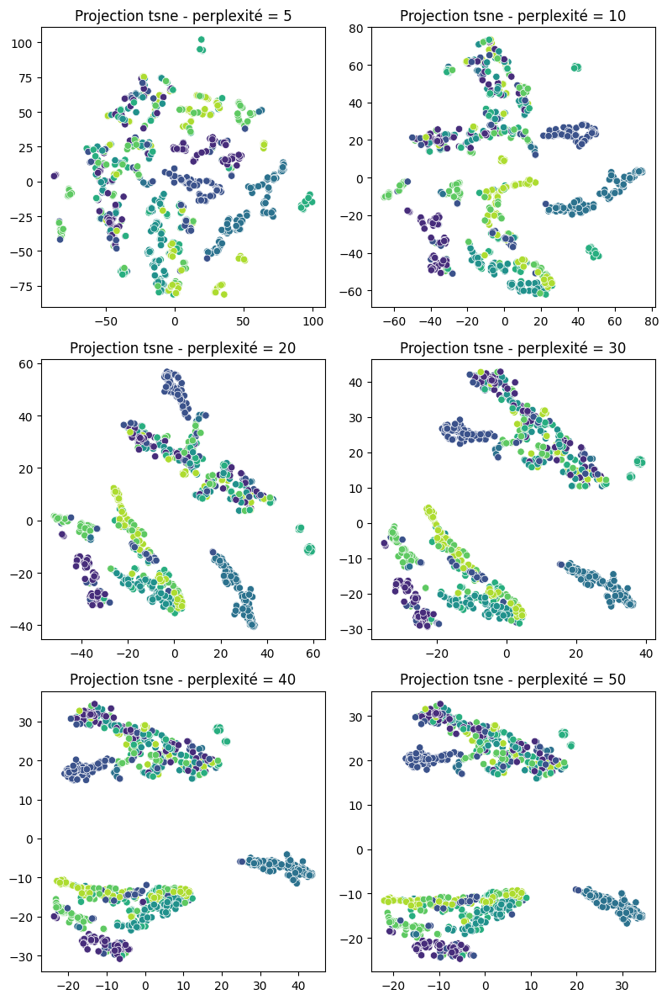

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 30
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
4,0.515264,59038.074219,0.703191


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2529
Homogénéité : 0.3345789042758394
Complétude : 0.3373777099589871
V-measure : 0.3359724783830232
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
w2v - CBOW - Descriptions tokenisées avec les stop_words
----------------------------------------------------------------------------------------------------


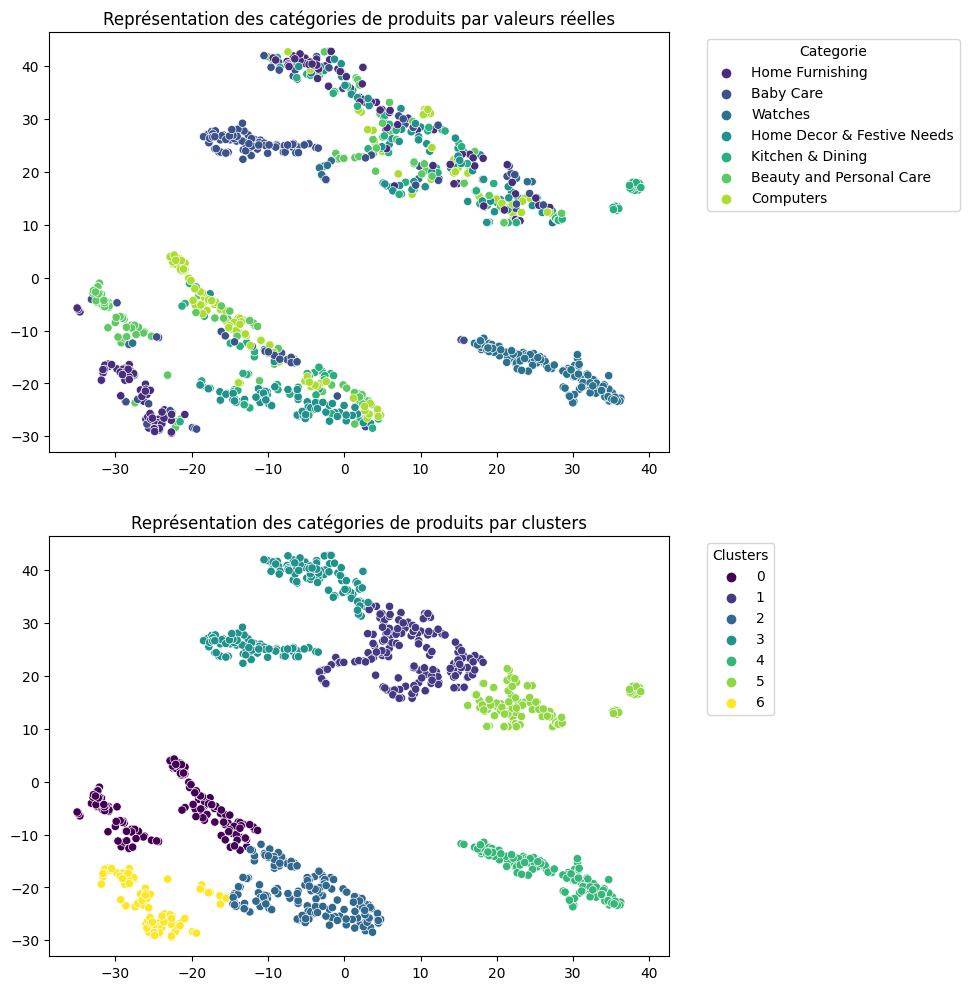

In [45]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='w2v - CBOW - Descriptions tokenisées avec les stop_words',  
        )

In [46]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['w2v_CBOW_desc_tokenise'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
 )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_w2v_CBOW_desc_tokenise',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
 )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result


##### 6.3.1.2. <a id='toc6_3_1_2_'></a>[Descriptions tokenisées sans les stop_words](#toc0_)

In [47]:
# Extraction de features : 

# Création du modèle : 
model = Word2Vec(
    sentences=data['desc_tokenize_without_sw'],
    vector_size=300,
    window=4,
    min_count=3,
    sg=0,
)

# Calcul des vecteurs moyens pour chaque descriptions : 
df = fct_NLP.mean_embending_w2v_df(
    descriptions=data['desc_tokenize_without_sw'].tolist(),
    word2vec_model=model,
    )

X = df.values

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


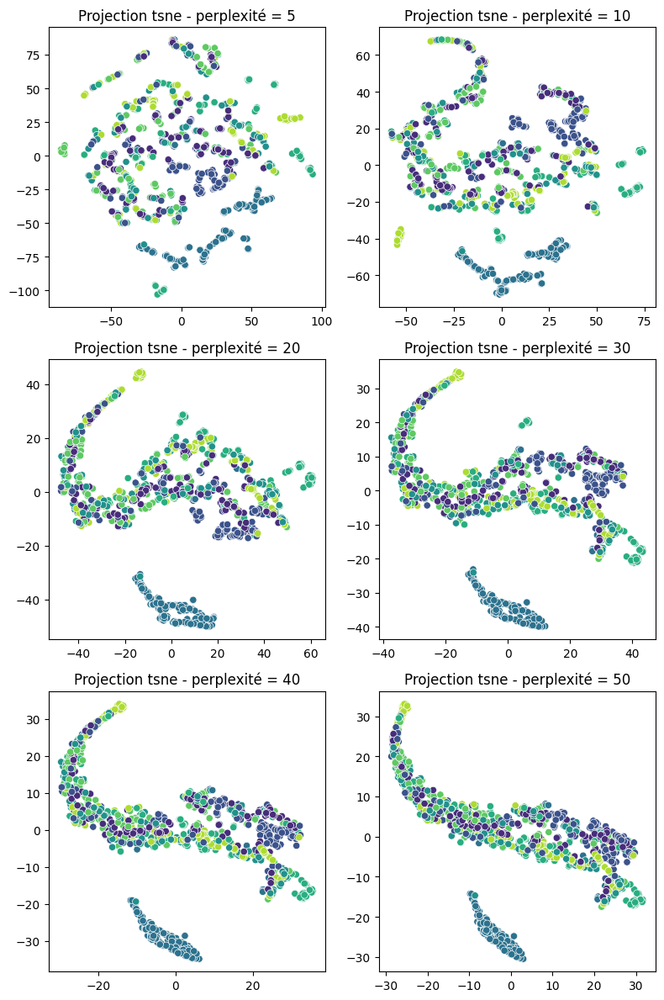

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 20
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.461121,121676.953125,0.710465


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2168
Homogénéité : 0.2827514658179947
Complétude : 0.285343974660832
V-measure : 0.2840418047702674
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
w2v - CBOW - Descriptions tokenisées sans les stop_words
----------------------------------------------------------------------------------------------------


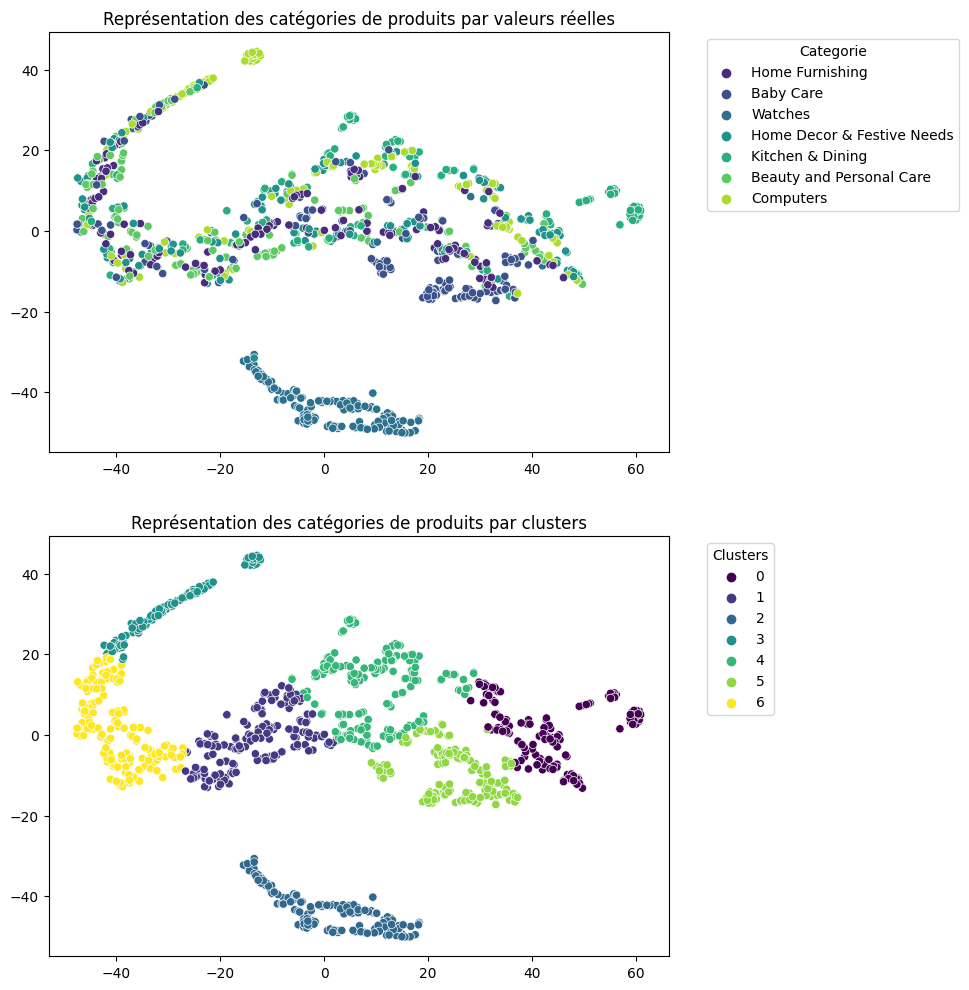

In [48]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='w2v - CBOW - Descriptions tokenisées sans les stop_words',  
        )

In [49]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['w2v_CBOW_desc_tokenise_without_sw'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_w2v_CBOW_desc_tokenise_without_sw',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.3.2. <a id='toc6_3_2_'></a>[Skip-gram](#toc0_)
##### 6.3.2.1. <a id='toc6_3_2_1_'></a>[Descriptions tokenisées avec stop_words](#toc0_)

In [50]:
# Extraction de features : 

# Création du modèle : 
model = Word2Vec(
    sentences=data['desc_tokenize'],
    vector_size=300,
    window=4,
    min_count=3,
    sg=1,
)

# Calcul des vecteurs moyens pour chaque descriptions : 
df = fct_NLP.mean_embending_w2v_df(
    descriptions=data['desc_tokenize'].tolist(),
    word2vec_model=model,
    )

X = df.values

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


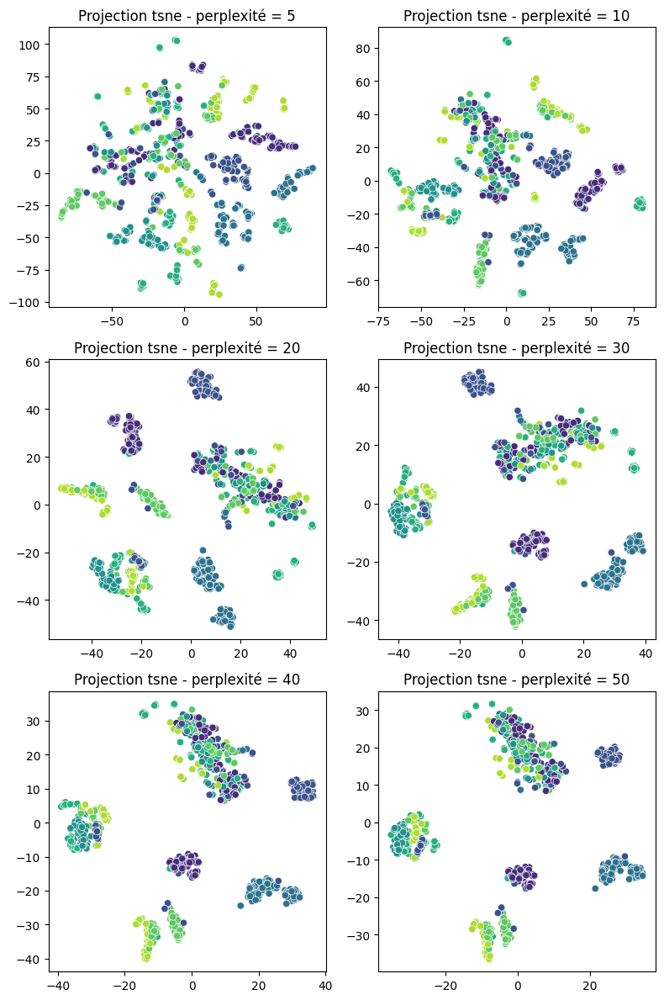

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 30
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.620015,62342.511719,0.516143


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2847
Homogénéité : 0.42032025320288025
Complétude : 0.4332828683471534
V-measure : 0.42670313717092234
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
w2v - Skip-gram - Descriptions tokenisées avec les stop_words
----------------------------------------------------------------------------------------------------


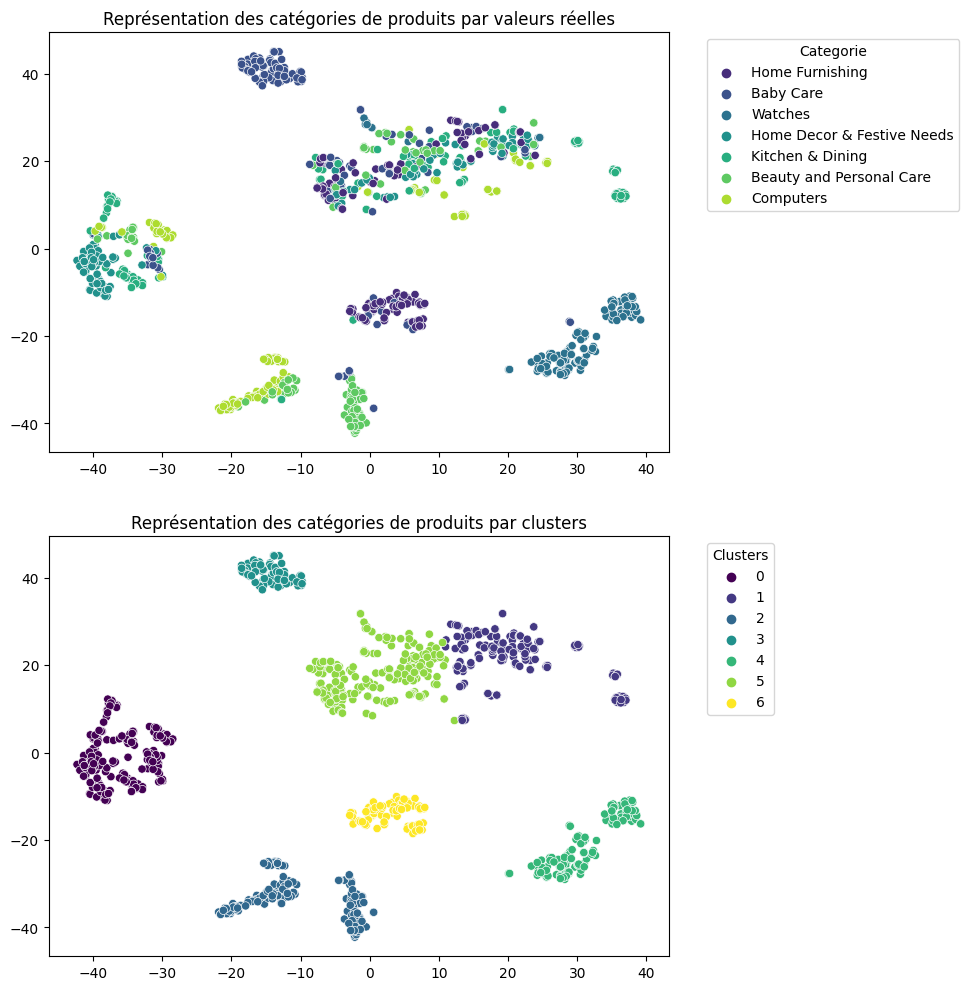

In [51]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='w2v - Skip-gram - Descriptions tokenisées avec les stop_words',  
        )

In [53]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['w2v_Sg_desc_tokenise'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_w2v_Sg_desc_tokenise',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

##### 6.3.2.2. <a id='toc6_3_2_2_'></a>[Descriptions tokenisées sans les stop_words](#toc0_)

In [54]:
# Extraction de features : 

# Création du modèle : 
model = Word2Vec(
    sentences=data['desc_tokenize_without_sw'],
    vector_size=300,
    window=4,
    min_count=3,
    sg=1,
)

# Calcul des vecteurs moyens pour chaque descriptions : 
df = fct_NLP.mean_embending_w2v_df(
    descriptions=data['desc_tokenize_without_sw'].tolist(),
    word2vec_model=model,
    )

X = df.values

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


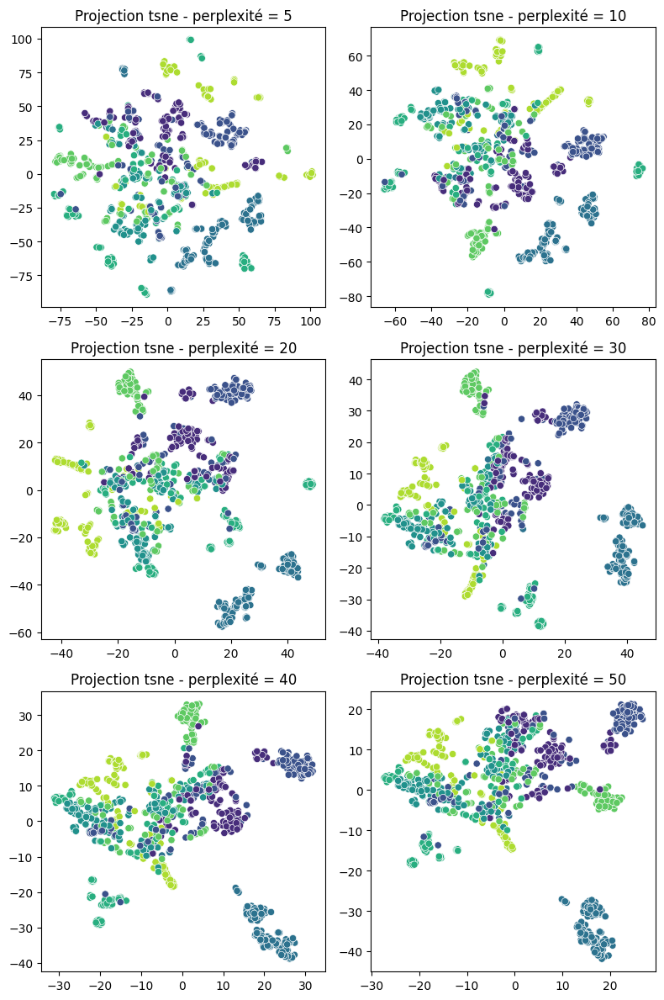

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 40
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.5385,52396.28125,0.624331


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.3462
Homogénéité : 0.46365694838942895
Complétude : 0.48328119416758275
V-measure : 0.4732657258829336
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
w2v - Skip-gram - Descriptions tokenisées sans les stop_words
----------------------------------------------------------------------------------------------------


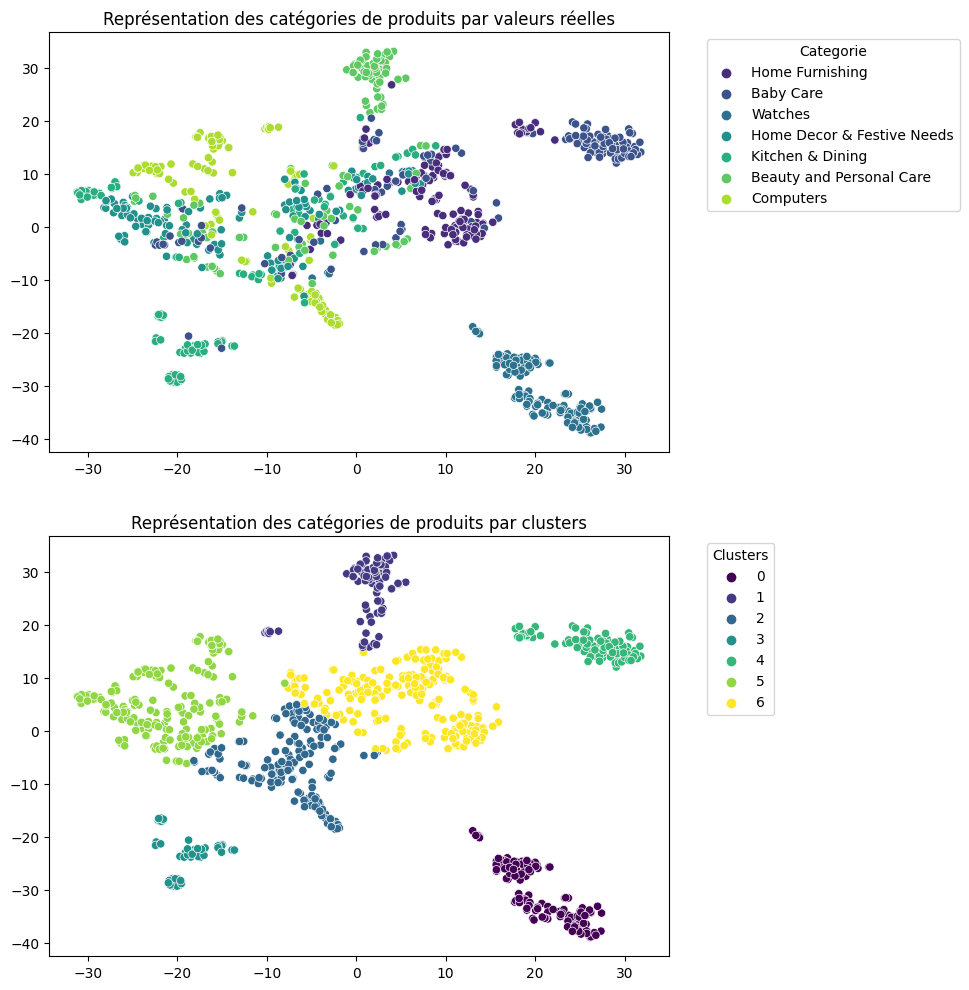

In [55]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='w2v - Skip-gram - Descriptions tokenisées sans les stop_words',  
        )

In [56]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['w2v_Sg_desc_tokenise_without_sw'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_w2v_Sg_desc_tokenise_without_sw',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

### 6.4. <a id='toc6_4_'></a>[Doc2Vec](#toc0_)
C'est une ensemble de modèles de réseaux de neurones pour la représentation vectorielle de textes.   
L'avantage de Doc2Vec par rapport à Word2Vec dans notre étude,  réside dans la capacité de Doc2Vec à représenter des documents entiers en tant qu'entités distinctes sans nécessiter un calcul de la moyenne des vecteurs de mots individuels.  
Doc2Vec créé un vecteur de document unique permettant la représentation de celui-ci sans perte d'information. 

Cet ensemble est composé de deux modèles disctincts : 
- **PV-DM (Distributed Memory)** : Ce modèle étend la méthode Skip-gram de Word2Vec pour prédire des mots en se basant sur le contexte des mots voisins, tout en maintenant une représentation vectorielle de chaque document. Chaque document est traité comme une "mémoire" qui est utilisée pour prédire les mots du contexte.
- **PV-DBOW (Distributed Bag of Words)** : À l'inverse, ce modèle se concentre sur la prédiction de documents entiers à partir de mots individuels. Il ignore le contexte et se concentre uniquement sur les mots présents dans le document cible.


*Hyperparamètres* :

|||
|-|-|
|**vector_size (int)**|Taille des vecteurs pour chaque document ou mot|
|**window (int)**|Distance maximale entre le mot actuel et les mots pris en compte pour la prédiction|
|**min_count (int)**|Permets d'ignorer les mots dont la fréquence est inférieure à cette valeur|
|**dm (bool)**|Permet la sélection du modèle (0 pour PV-DBOW ou 1 pour PV-DM)|
|||

Ici, prendrons les hypermparamètres suivant : 
- vector_size = 300 (taille maximal du nombre de features par mot)
- window = 4 (prise en compte des 4 mots à gauche et droite de la cible)
- min_count = 3 (élimination des mots présents moins de 3 fois, simplification de la dimmensionnalité sans perdre en pertinence)

#### 6.4.1. <a id='toc6_4_1_'></a>[PV-DBOW](#toc0_)
##### 6.4.1.1. <a id='toc6_4_1_1_'></a>[Descriptions tokenisées avec les stop_words](#toc0_)


In [57]:
# Extraction de features : 

# 1. Tags des descriptions : 
tagged_data = [
    TaggedDocument(words=description, tags=[str(i)]) for i, description in enumerate(data['desc_tokenize'])
        ]

# 2. Initialisation et entrainement du modèle : 
model = Doc2Vec(
    vector_size=300,
    window=4,
    min_count=3,
    dm=0,
    )

model.build_vocab(tagged_data)
model.train(
    tagged_data,
    total_examples=model.corpus_count,
    epochs=model.epochs,
    )

# 3. Récupération des vecteurs pour de chaque descirption : 
desc_vectors = [model.infer_vector(description) for description in data['desc_tokenize']]

# 4. Création d'un DataFrame : 
df = pd.DataFrame(desc_vectors, columns=[f"embedding_{i}" for i in range(model.vector_size)])

X = df.values

# Affichage : 
print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del tagged_data, desc_vectors

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


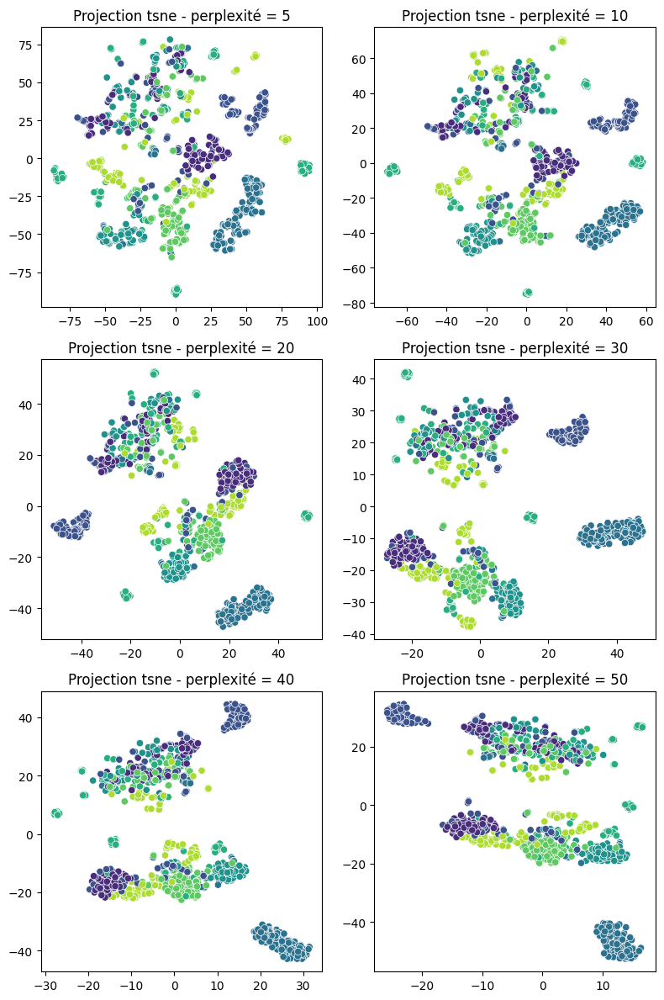

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 50
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.51554,32462.757812,0.753947


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2786
Homogénéité : 0.3967040169632361
Complétude : 0.4049564260195121
V-measure : 0.4007877457425528
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
d2v - PV-DBOW - Descriptions tokenisées avec les stop_words
----------------------------------------------------------------------------------------------------


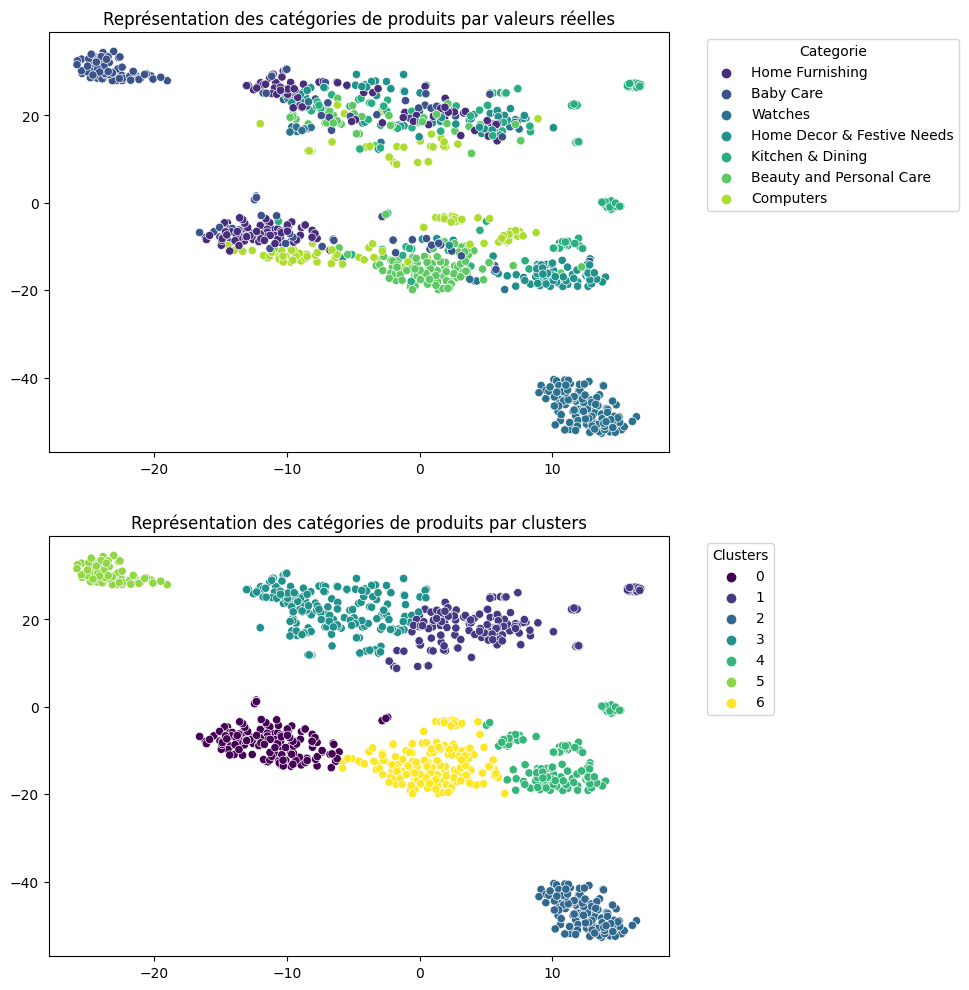

In [58]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='d2v - PV-DBOW - Descriptions tokenisées avec les stop_words',  
        )

In [59]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['d2v_PVDBOW_desc_tokenise'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_d2v_PVDBOW_desc_tokenise',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

##### 6.4.1.2. <a id='toc6_4_1_2_'></a>[Description tokenisées sans les stop_words](#toc0_)

In [60]:
# Extraction de features : 

# 1. Tags des descriptions : 
tagged_data = [
    TaggedDocument(words=description, tags=[str(i)]) for i, description in enumerate(data['desc_tokenize_without_sw'])
        ]

# 2. Initialisation et entrainement du modèle : 
model = Doc2Vec(
    vector_size=300,
    window=4,
    min_count=3,
    dm=0,
    )

model.build_vocab(tagged_data)
model.train(
    tagged_data,
    total_examples=model.corpus_count,
    epochs=model.epochs,
    )

# 3. Récupération des vecteurs pour de chaque descirption : 
desc_vectors = [model.infer_vector(description) for description in data['desc_tokenize_without_sw']]

# 4. Création d'un DataFrame : 
df = pd.DataFrame(desc_vectors, columns=[f"embedding_{i}" for i in range(model.vector_size)])

X = df.values

# Affichage : 
print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del tagged_data, desc_vectors

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


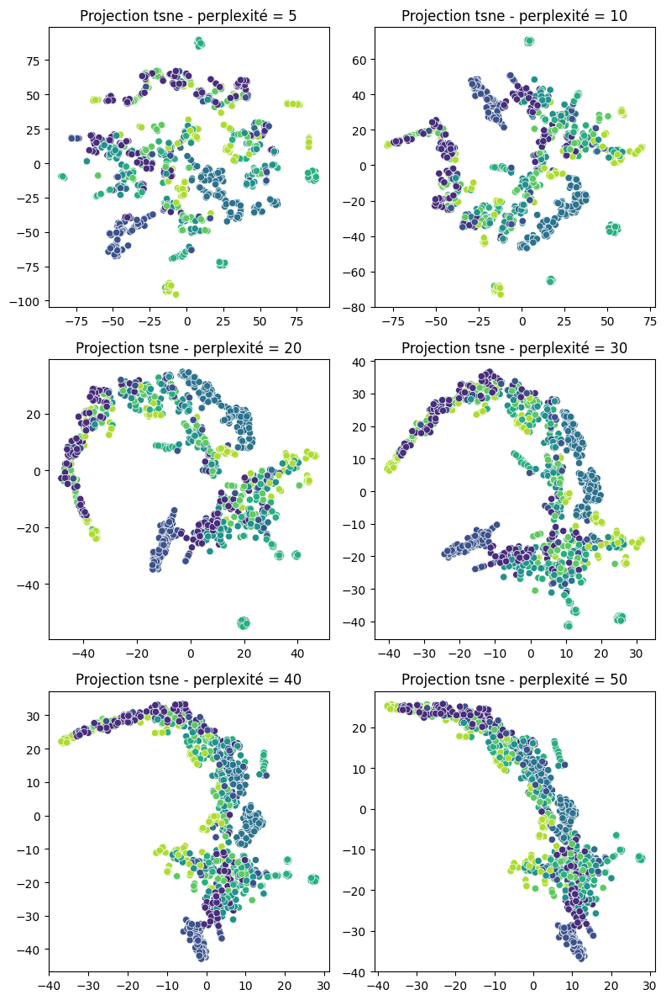

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 30
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
6,0.456214,67579.429688,0.771534


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.1513
Homogénéité : 0.21894519020387967
Complétude : 0.22059781314958943
V-measure : 0.21976839485603689
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
d2v - PV-DBOW - Descriptions tokenisées sans les stop_words
----------------------------------------------------------------------------------------------------


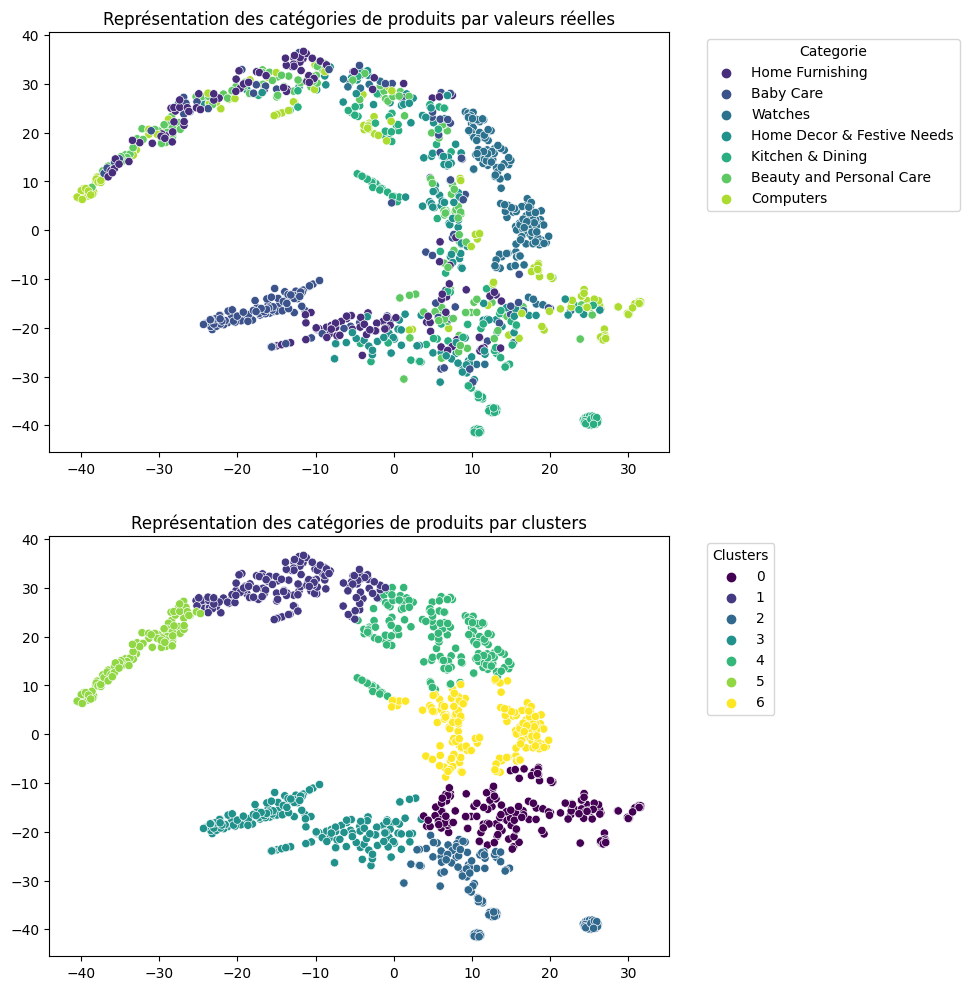

In [62]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='d2v - PV-DBOW - Descriptions tokenisées sans les stop_words',  
        )

In [63]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['d2v_PVDBOW_desc_tokenise_without_sw'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_d2v_PVDBOW_desc_tokenise_without_sw',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.4.2. <a id='toc6_4_2_'></a>[PV-DM](#toc0_)
##### 6.4.2.1. <a id='toc6_4_2_1_'></a>[Descriptions tokenisées avec les stop_words](#toc0_)

In [64]:
# Extraction de features : 

# 1. Tags des descriptions : 
tagged_data = [
    TaggedDocument(words=description, tags=[str(i)]) for i, description in enumerate(data['desc_tokenize'])
        ]

# 2. Initialisation et entrainement du modèle : 
model = Doc2Vec(
    vector_size=300,
    window=4,
    min_count=3,
    dm=1,
    )

model.build_vocab(tagged_data)
model.train(
    tagged_data,
    total_examples=model.corpus_count,
    epochs=model.epochs,
    )

# 3. Récupération des vecteurs pour de chaque descirption : 
desc_vectors = [model.infer_vector(description) for description in data['desc_tokenize']]

# 4. Création d'un DataFrame : 
df = pd.DataFrame(desc_vectors, columns=[f"embedding_{i}" for i in range(model.vector_size)])

X = df.values

# Affichage : 
print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del tagged_data, desc_vectors

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


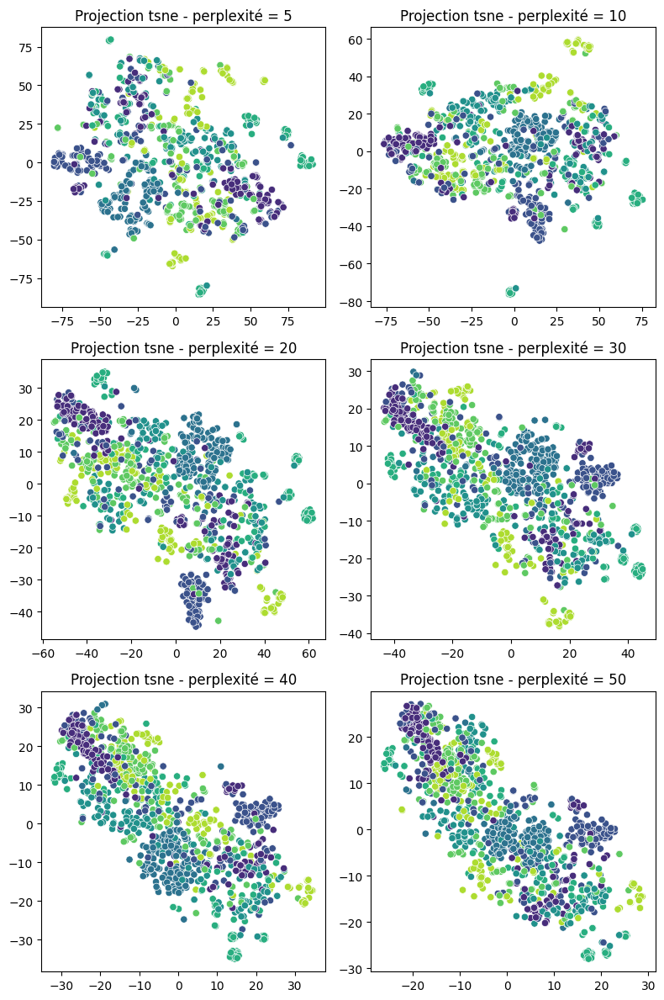

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 10
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.397076,268971.0625,0.786118


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2408
Homogénéité : 0.2862337565856763
Complétude : 0.28836928088813113
V-measure : 0.28729755037635835
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
d2v - PV-DM - Descriptions tokenisées avec les stop_words
----------------------------------------------------------------------------------------------------


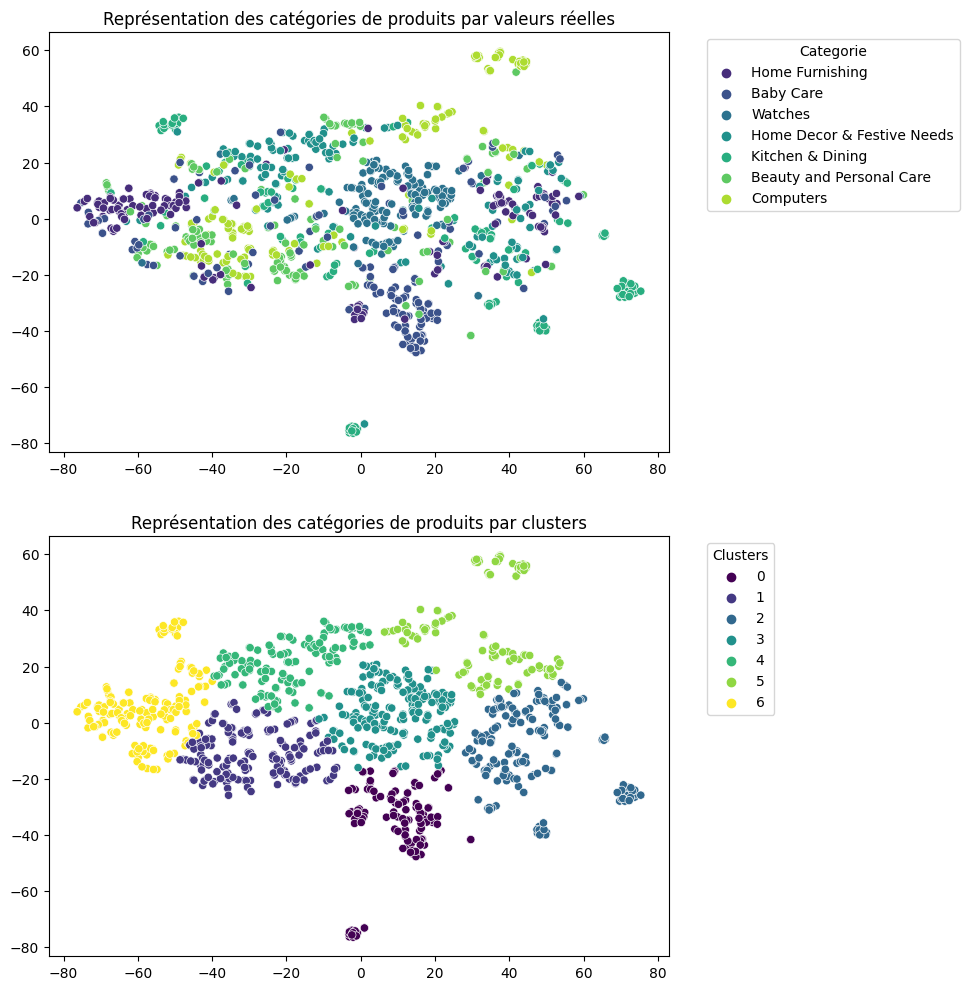

In [65]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='d2v - PV-DM - Descriptions tokenisées avec les stop_words',  
        )

In [66]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['d2v_PVDM_desc_tokenise'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_d2v_PVDM_desc_tokenise',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

##### 6.4.2.2. <a id='toc6_4_2_2_'></a>[Description tokenisées sans les stop_words](#toc0_)

In [67]:
# Extraction de features : 

# 1. Tags des descriptions : 
tagged_data = [
    TaggedDocument(words=description, tags=[str(i)]) for i, description in enumerate(data['desc_tokenize_without_sw'])
        ]

# 2. Initialisation et entrainement du modèle : 
model = Doc2Vec(
    vector_size=300,
    window=4,
    min_count=3,
    dm=1,
    )

model.build_vocab(tagged_data)
model.train(
    tagged_data,
    total_examples=model.corpus_count,
    epochs=model.epochs,
    )

# 3. Récupération des vecteurs pour de chaque descirption : 
desc_vectors = [model.infer_vector(description) for description in data['desc_tokenize_without_sw']]

# 4. Création d'un DataFrame : 
df = pd.DataFrame(desc_vectors, columns=[f"embedding_{i}" for i in range(model.vector_size)])

X = df.values

# Affichage : 
print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del tagged_data, desc_vectors

Dimension du DataFrame de vectorisation : (1050, 300)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


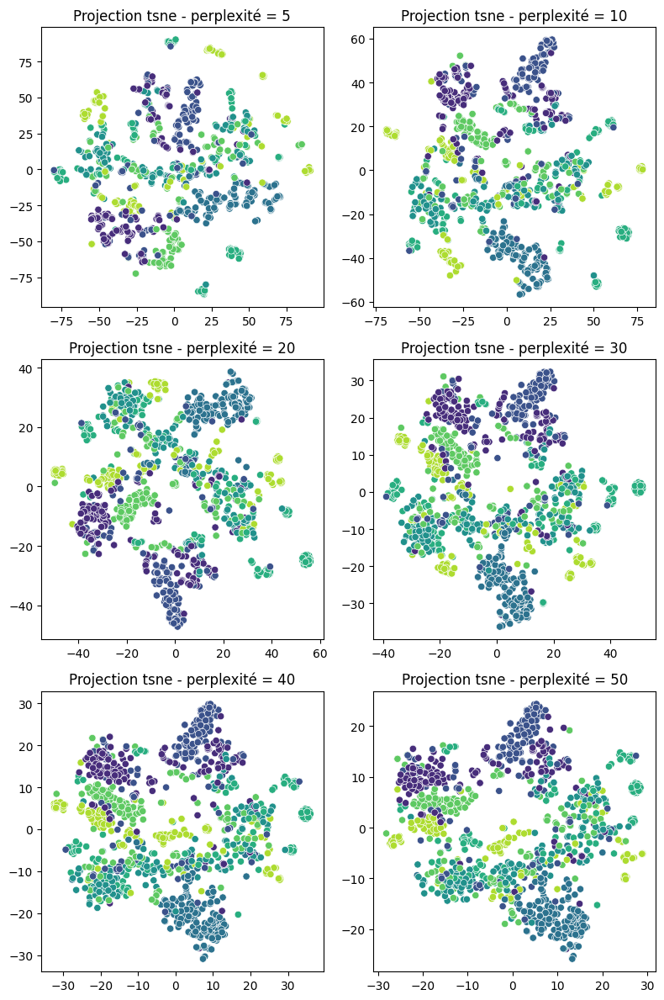

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 40
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
15,0.463432,55401.28125,0.746907


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2579
Homogénéité : 0.33720722775313505
Complétude : 0.34435406926782786
V-measure : 0.3407431776741389
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
d2v - PV-DM - Descriptions tokenisées sans les stop_words
----------------------------------------------------------------------------------------------------


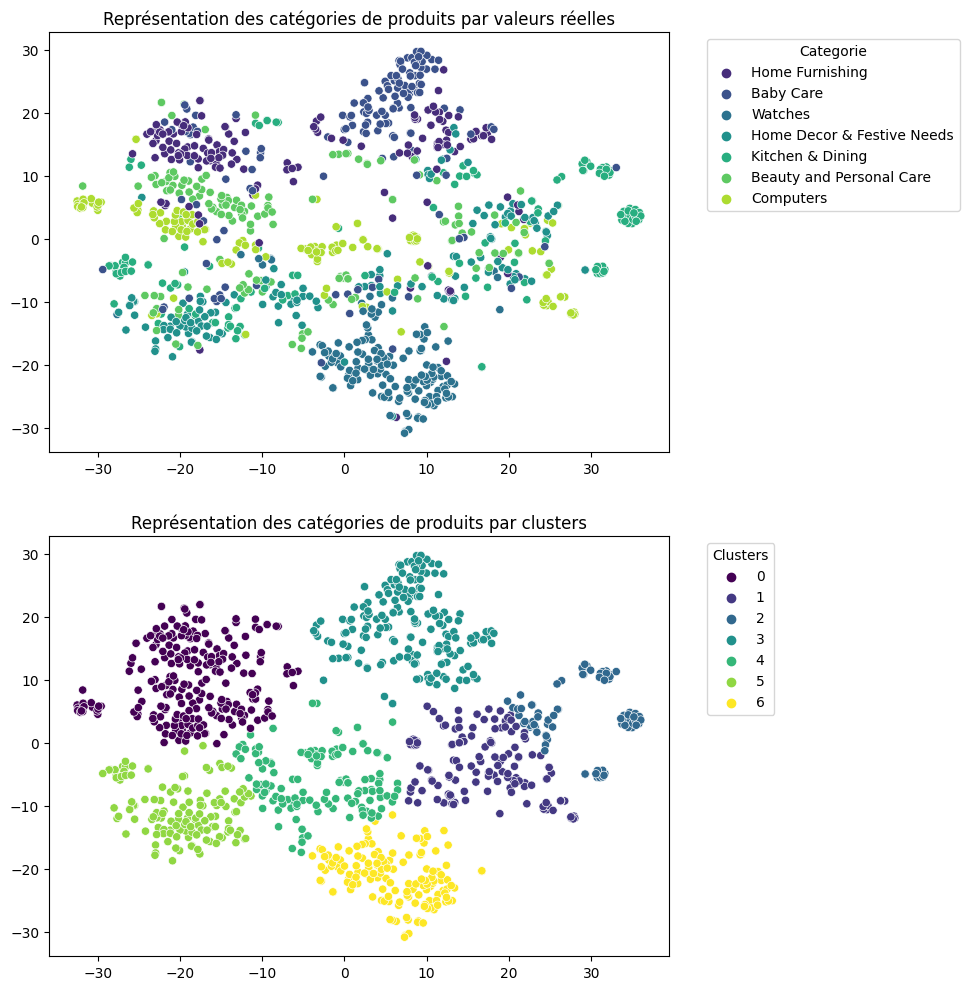

In [68]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='d2v - PV-DM - Descriptions tokenisées sans les stop_words',  
        )

In [69]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['d2v_PVDM_desc_tokenise_without_sw'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
    
# 4. Enregistrement du modèle entrainé : 
fct_data.enregistrement_pickle(
    name='model_d2v_PVDM_desc_tokenise_without_sw',
    chemin='2. Sauvegardes/1. NLP',
    fichier=model,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

### 6.5. <a id='toc6_5_'></a>[BERT](#toc0_)
- BERT (Bidirectional Encoder Representations from Transformers) est un transformateur bidirectionnel pour le pré-entraînement sur un grand nombre de données textuelles non étiquetées afin d'apprendre une représentation du langage qui peut être utilisée pour affiner les tâches d'apprentissage automatique spécifiques.
- Plusieurs variantes de BERT existent. 

*Variantes utilisées dans notre étude*
|Variante|Description|
|-|-|
|DistilBERT (base-uncased)|Version de base de DistilBERT (version plus légère en ressource que BERT) pré-entrainé sur un grand corpus de texte anglais|
|DistilBERT (base uncased finetuned SST-2)|Version de DistilBERT spécifiquement entrainé sur la classification de sentiment|
|RoBERTa (Large)|Modèle de transformateur pré-entraîné sur un large corpus de données anglaises (auto-supervisée)| 

#### 6.5.1. <a id='toc6_5_1_'></a>[DistilBERT-base-uncased](#toc0_)

In [70]:
# Extraction de features :

# 1. Création du tokenizer sépcifique : 
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# 2. Création du modèle : 
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

# 3. Création de la liste de stockage des embeddings : 
desc_embeddings = []

# 4. Récupération des embeddings pour chaque description : 
for description in data['description']:
    
    # 4.1 Tokenisation des descriptions : 
    tokens = tokenizer(description, padding=True, truncation=True, return_tensors="pt")
    
    # 4.2 Création d'un tenseurs pour chaque descritpions (embeddings) : 
    with torch.no_grad():
        outputs = model(**tokens)
        embeddings = outputs.last_hidden_state.mean(dim=1)  
    
    # 4.3 Stockage des tenseurs dans une liste : 
    desc_embeddings.append(embeddings)

# 5. Concaténation des embeddings en un seul tenseur : 
desc_embeddings = torch.cat(desc_embeddings, dim=0)

# Création d'un DataFrame avec les embeddings : 
df = pd.DataFrame(desc_embeddings.numpy(), columns=[f"embedding_{i}" for i in range(desc_embeddings.shape[1])])

X = df.values 

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del tokenizer, desc_embeddings, description, tokens, outputs, embeddings

Dimension du DataFrame de vectorisation : (1050, 768)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


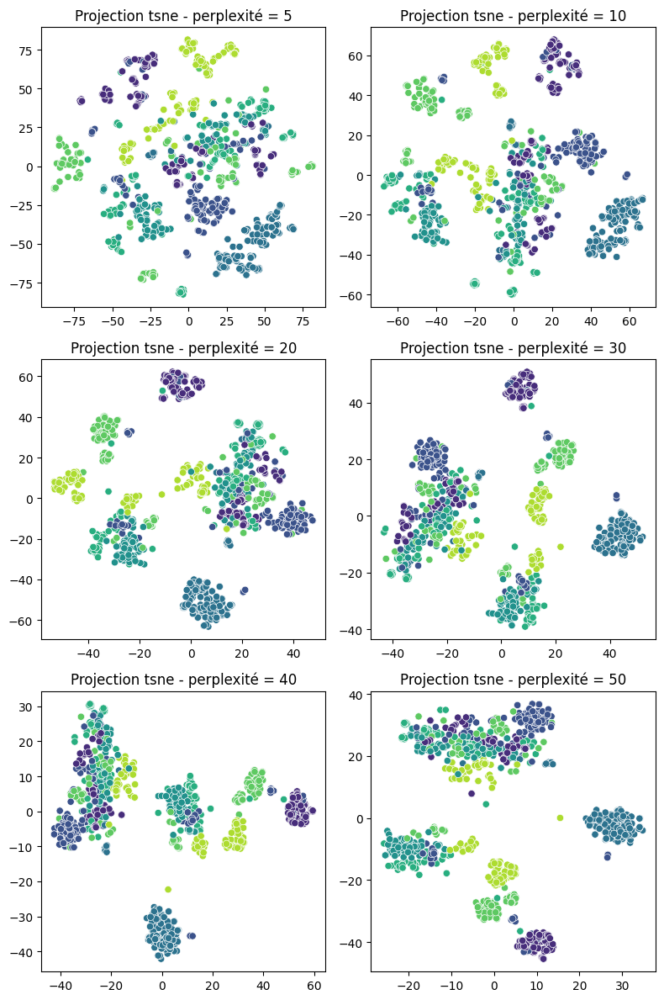

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 50
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.570732,36521.816406,0.61577


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.3096
Homogénéité : 0.4168192488969963
Complétude : 0.4215166030999342
V-measure : 0.4191547659168253
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
DistilBERT_base_uncased_desc_brut
----------------------------------------------------------------------------------------------------


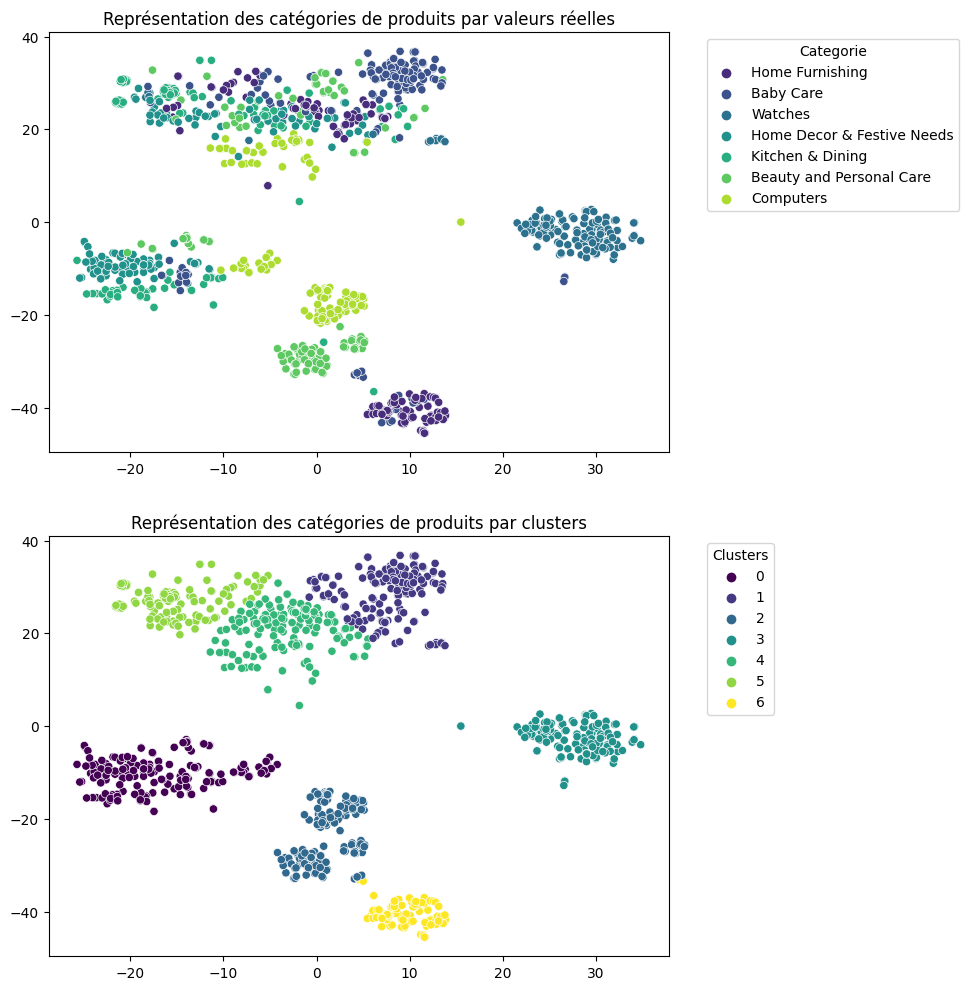

In [71]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='DistilBERT_base_uncased_desc_brut',  
        )

In [72]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['DistilBERT_base_uncased_desc_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )
 
del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.5.2. <a id='toc6_5_2_'></a>[DistilBERT-base-uncased-finetuned-SST-2](#toc0_)

In [73]:
# Extraction de features :

# 1. Création du tokenizer sépcifique : 
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased-finetuned-sst-2-english')

# 2. Création du modèle : 
model = DistilBertModel.from_pretrained('distilbert-base-uncased-finetuned-sst-2-english')

# 3. Création de la liste de stockage des embeddings : 
desc_embeddings = []

# 4. Récupération des embeddings pour chaque description : 
for description in data['description']:
    
    # 4.1 Tokenisation des descriptions : 
    tokens = tokenizer(description, padding=True, truncation=True, return_tensors="pt")
    
    # 4.2 Création d'un tenseurs pour chaque descritpions (embeddings) : 
    with torch.no_grad():
        outputs = model(**tokens)
        embeddings = outputs.last_hidden_state.mean(dim=1)  
    
    # 4.3 Stockage des tenseurs dans une liste : 
    desc_embeddings.append(embeddings)

# 5. Concaténation des embeddings en un seul tenseur : 
desc_embeddings = torch.cat(desc_embeddings, dim=0)

# Création d'un DataFrame avec les embeddings : 
df = pd.DataFrame(desc_embeddings.numpy(), columns=[f"embedding_{i}" for i in range(desc_embeddings.shape[1])])

X = df.values 

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del tokenizer, desc_embeddings, description, tokens, outputs, embeddings

Dimension du DataFrame de vectorisation : (1050, 768)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


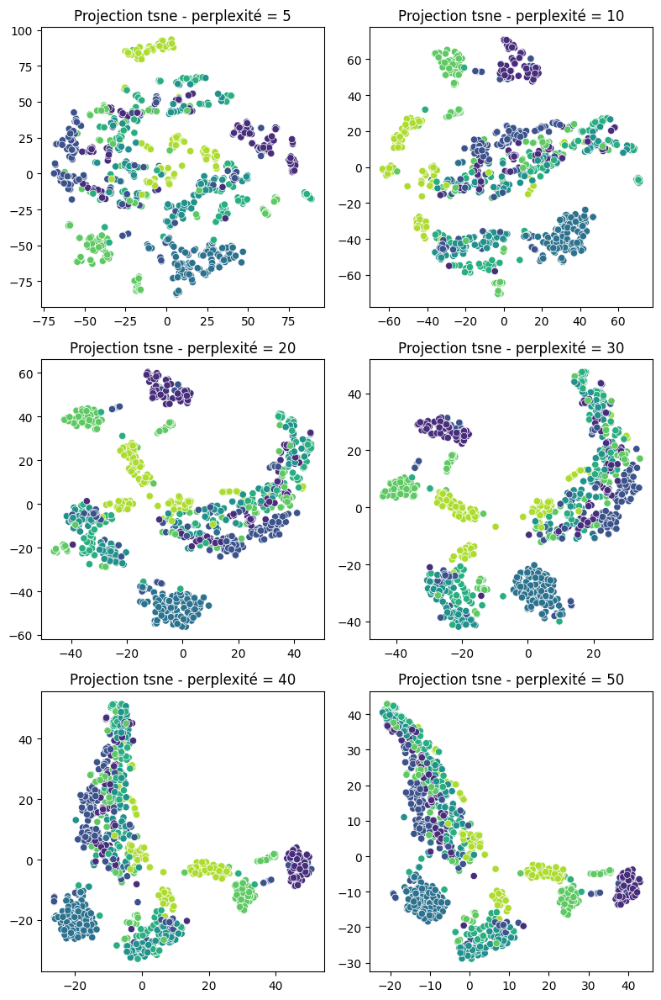

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 10
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.495689,249839.828125,0.685282


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.3003
Homogénéité : 0.39396954864924516
Complétude : 0.39712621190959224
V-measure : 0.3955415823547957
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
DistilBERT_base_uncased_ft_SST2_desc_brut
----------------------------------------------------------------------------------------------------


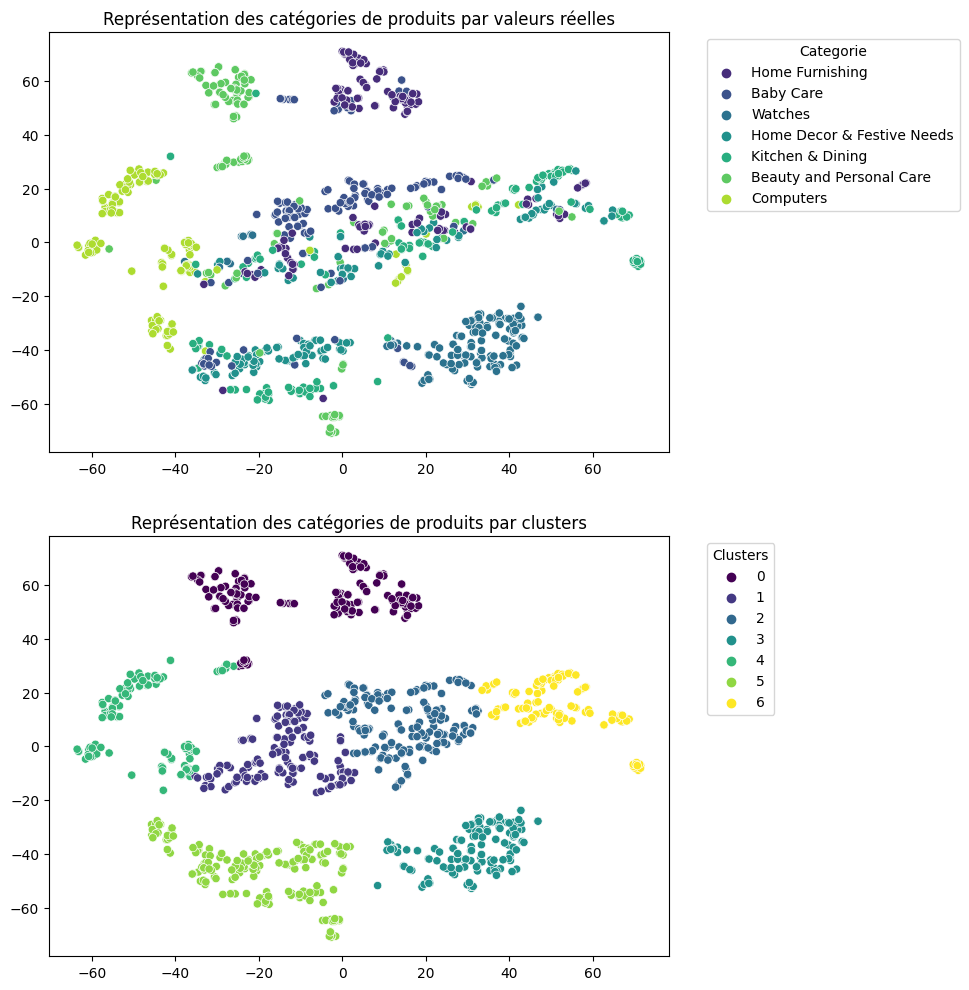

In [74]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='DistilBERT_base_uncased_ft_SST2_desc_brut',  
        )

In [75]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['DistilBERT_base_uncased_ft_SST2_desc_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.5.3. <a id='toc6_5_3_'></a>[RoBERTa-Large](#toc0_)

In [76]:
# Extraction de features : 

# 1. Création du tokenizer spécifique :
tokenizer = RobertaTokenizer.from_pretrained('roberta-large')

# 2. Création du modèle :
model = RobertaModel.from_pretrained('roberta-large')

# 3. Création de la liste de stockage des embeddings :
desc_embeddings = []

# 4. Récupération des embeddings pour chaque description :
for description in data['description']:
    
    # 4.1 Tokenisation des descriptions :
    tokens = tokenizer(description, padding=True, truncation=True, return_tensors="pt")
    
    # 4.2 Création de tenseurs pour chaque description (embeddings) :
    with torch.no_grad():
        outputs = model(**tokens)
        embeddings = outputs.last_hidden_state.mean(dim=1)  
    
    # 4.3 Stockage des tenseurs dans une liste :
    desc_embeddings.append(embeddings)

# 5. Concaténation des embeddings en un seul tenseur :
desc_embeddings = torch.cat(desc_embeddings, dim=0)

# Création d'un DataFrame avec les embeddings :
df = pd.DataFrame(desc_embeddings.numpy(), columns=[f"embedding_{i}" for i in range(desc_embeddings.shape[1])])

X = df.values 

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

# Suppression des variables temporaires pour libérer la mémoire
del tokenizer, desc_embeddings, description, tokens, outputs, embeddings


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Dimension du DataFrame de vectorisation : (1050, 1024)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


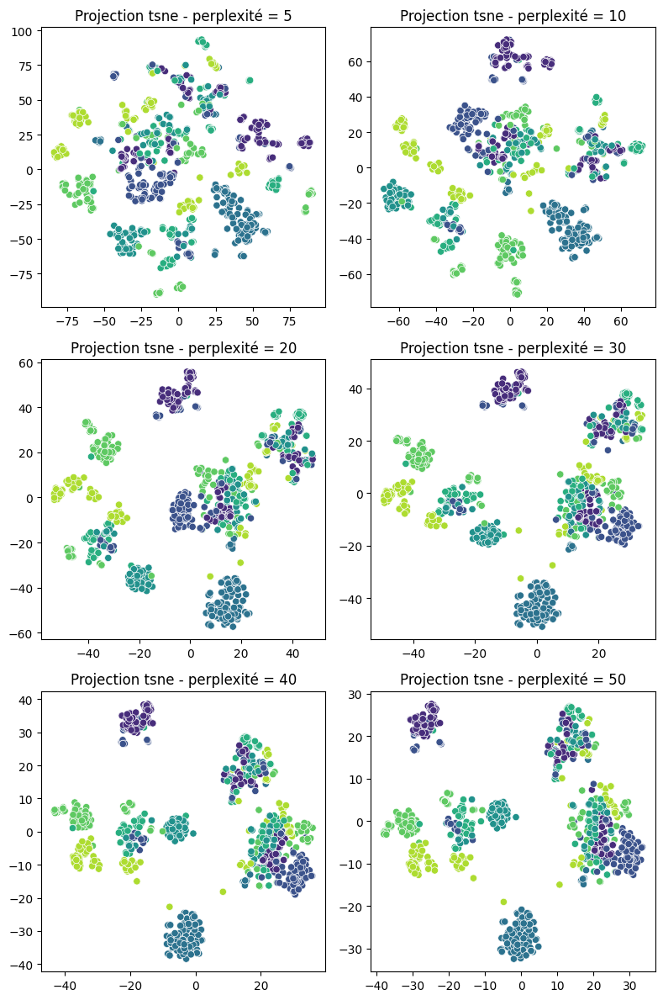

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 40
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
1,0.582527,46302.765625,0.648878


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.2989
Homogénéité : 0.40369404715236745
Complétude : 0.40704421917599043
V-measure : 0.4053622112924393
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
RoBERTa_Large_desc_brut
----------------------------------------------------------------------------------------------------


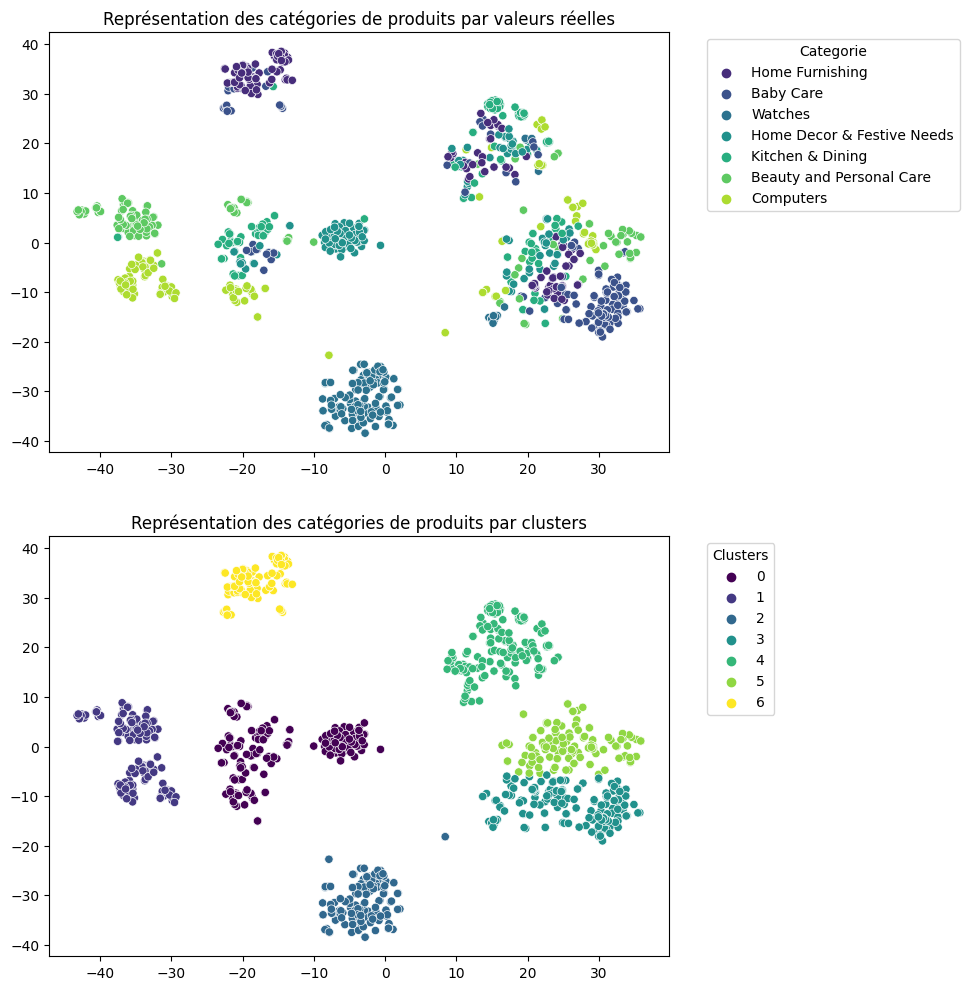

In [77]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='RoBERTa_Large_desc_brut', 
        )

In [78]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['RoBERTa_Large_desc_brut'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

### 6.6. <a id='toc6_6_'></a>[USE (Universal Sentence Encoder)](#toc0_)

Le modèle Universal Sentence Encoder (USE) est conçu pour convertir des phrases ou des textes entiers en vecteurs d'embeddings numériques, ce qui permet de mesurer la similarité sémantique entre différentes phrases ou textes.  
Il a été pré-entraîné sur une grande quantité de données textuelles provenant du web.

Nous utiliserons ici, USE et USE-Large (version plus importante que USE) dans leur dernière version.
#### 6.6.1. <a id='toc6_6_1_'></a>[USE-v4](#toc0_)

In [8]:
# Extraction de features : 

# 1. Chargement du modèle : 
model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# 2. Création des embeddings : 
embeddings = model(data['description'].tolist())

# 3. Création du DataFrame : 
df = pd.DataFrame(embeddings.numpy(), columns=[f"embedding_{i}" for i in range(embeddings.shape[1])])

X = df.values

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del embeddings

Dimension du DataFrame de vectorisation : (1050, 512)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


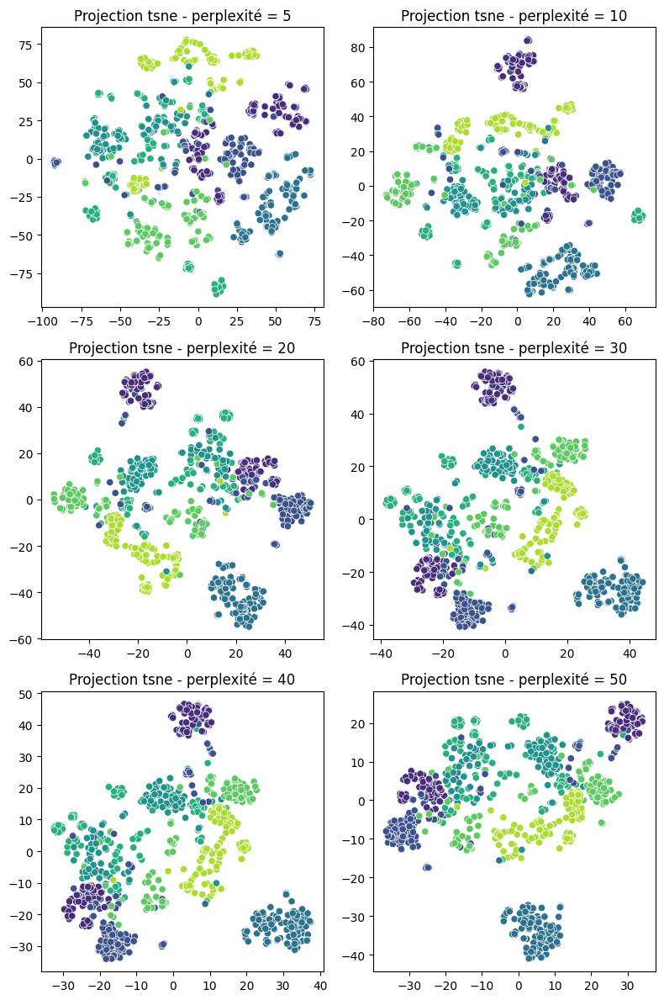

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 20
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
23,0.492362,138379.28125,0.72656


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.444
Homogénéité : 0.5674656219457647
Complétude : 0.5738587438743468
V-measure : 0.5706442773920374
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
USE_v4
----------------------------------------------------------------------------------------------------


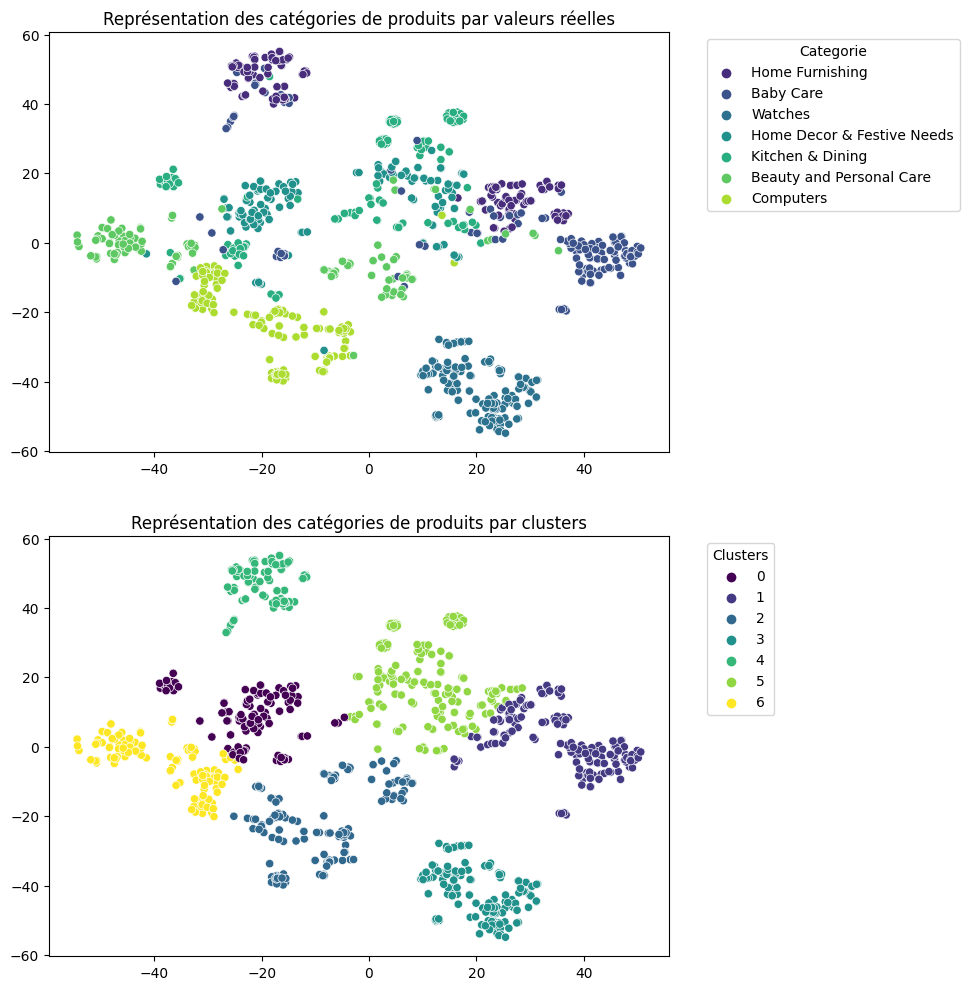

In [9]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='USE_v4',  
        )

In [10]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['USE_v4'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

#### 6.6.2. <a id='toc6_6_2_'></a>[USE-Large-v5](#toc0_)

In [11]:
# Extraction de features : 

# 1. Chargement du modèle : 
model = hub.load("https://tfhub.dev/google/universal-sentence-encoder-large/5")

# 2. Création des embeddings : 
embeddings = model(data['description'].tolist())

# 3. Création du DataFrame : 
df = pd.DataFrame(embeddings.numpy(), columns=[f"embedding_{i}" for i in range(embeddings.shape[1])])

X = df.values

print(f"Dimension du DataFrame de vectorisation : {df.shape}")

del embeddings

Dimension du DataFrame de vectorisation : (1050, 512)


----------------------------------------------------------------------------------------------------
Projections en 2D avec réduction TSNE en fonction de la perplexité


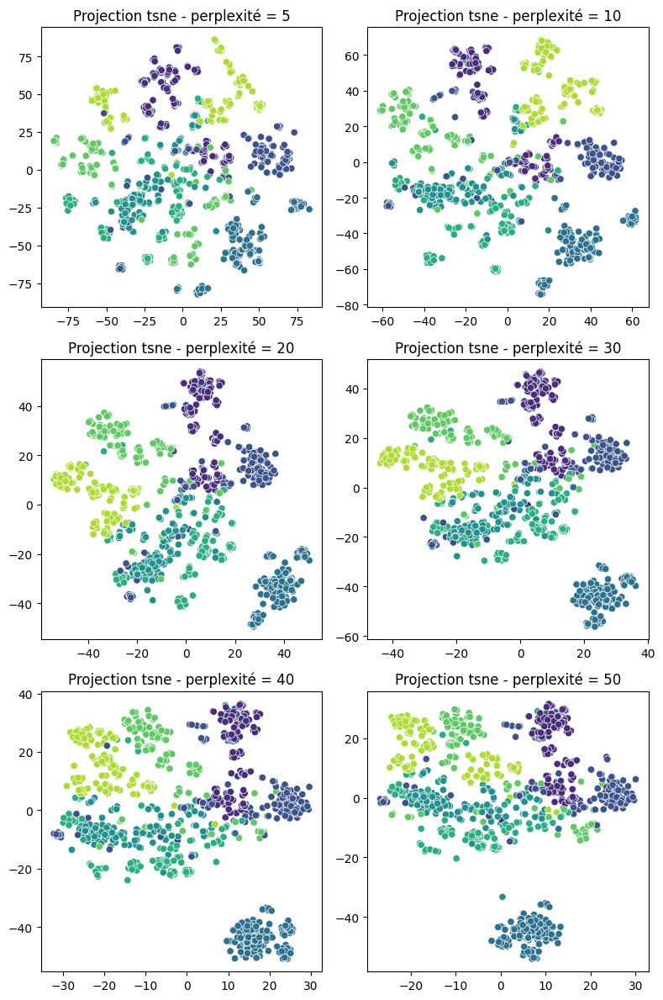

----------------------------------------------------------------------------------------------------
Meilleure perplexité de TSNE : 20
----------------------------------------------------------------------------------------------------
Meilleurs paramètres de KMeans : {'n_clusters': 7, 'random_state': 42, 'n_init': 10, 'max_iter': 100}


,coef_silh,dispersion,davies_bouldin
0,0.492515,141309.0,0.732625


----------------------------------------------------------------------------------------------------
Score ARI du clustering : 0.5665
Homogénéité : 0.6536200691795726
Complétude : 0.6587202756974795
V-measure : 0.656160261859069
----------------------------------------------------------------------------------------------------
Comparaison des projections du clustering vs catégories réelles
->
USE_Large_v5
----------------------------------------------------------------------------------------------------


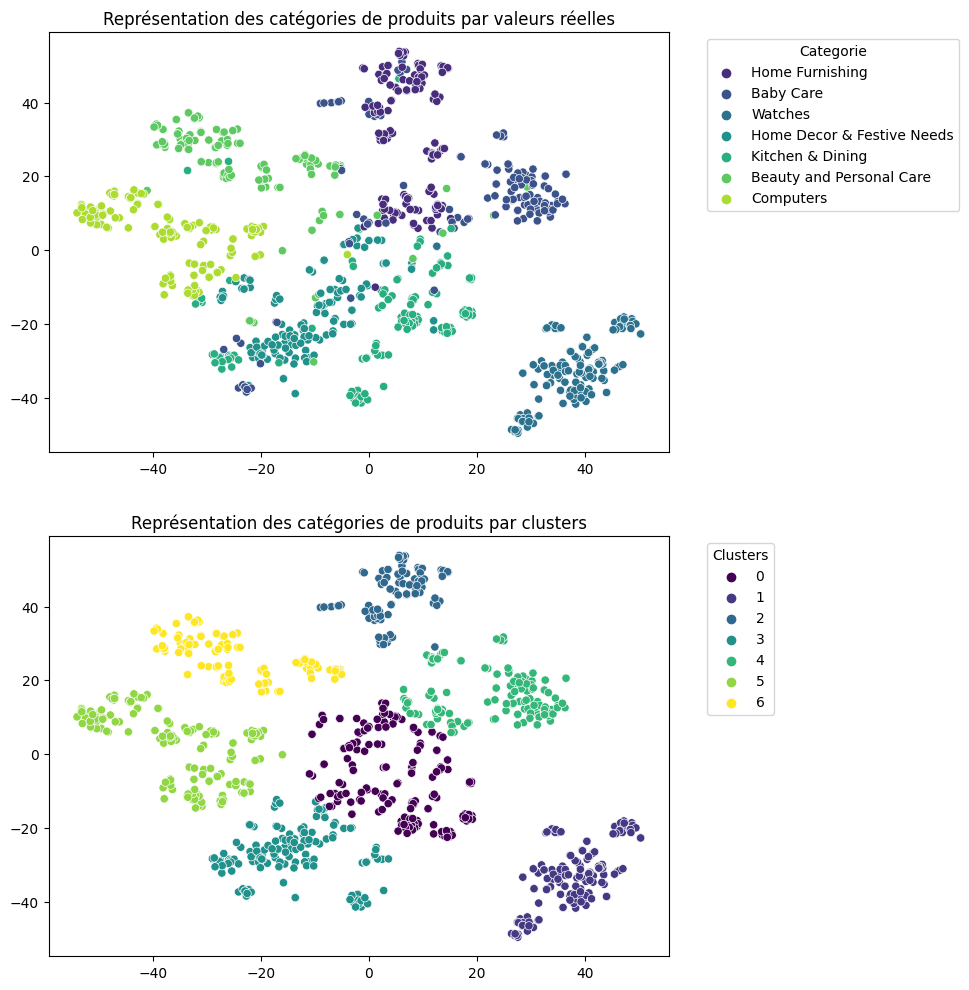

In [12]:
# Clustering : 

kmeans_params, tsne_perplexity, labels, dict_result = \
    fct_clustering.best_clustering(
        features=X, 
        y_true=data['category_cleaned'],
        tsne_perplexity_range=[5, 10, 20, 30, 40, 50],
        kmeans_clusters=data['category_cleaned'].nunique(),
        ls_ninit=[10, 20, 30, 50, 70, 80, 100],
        ls_maxiter=[100, 200, 300, 400, 500],
        title='USE_Large_v5',
        )

In [13]:
# Enregistrement des résultats : 

# 1. Complétion de df : 
df['Category_true'] = data['category_cleaned']
df['Category_predict'] = labels

 # 2. Stockage des données : 
dict_desc_class_non_supervisée['USE_Large_v5'] = {
    'df_vectorisation': df,
    'kmeans_best_params': kmeans_params,
    'TSNE_perplexity' : tsne_perplexity,
    'clustering_result' : dict_result
}

# 3. Enregistrement du dictionnaire au format pickle : 
fct_data.enregistrement_pickle(
    name='dict_desc_class_non_supervisée',
    chemin='2. Sauvegardes/1. NLP',
    fichier=dict_desc_class_non_supervisée,
    )

del X, df, labels, kmeans_params, tsne_perplexity, dict_result

## 7. <a id='toc7_'></a>[Résultats](#toc0_)

In [4]:
# Chargement des données : 

dict_desc_class_non_supervisée = \
    fct_data.chargement_pickle(
        name='dict_desc_class_non_supervisée',
        chemin='2. Sauvegardes/1. NLP',
        )
data = \
    fct_data.chargement_pickle(
        name='data_pretraite_NLP',
        chemin='2. Sauvegardes/1. NLP',
    )

,ARI,Homogénéité,Complétude,V-measure
Modèle,,,,
USE_Large_v5,0.5665,0.653620,0.658720,0.656160
bow_Tfidf_desc_cleaned_lem,0.5276,0.601273,0.608194,0.604714
bow_Tfidf_desc_cleaned_stem,0.4745,0.572714,0.588993,0.580740
USE_v4,0.4440,0.567466,0.573859,0.570644
bow_CV_desc_cleaned_stem,0.4022,0.499879,0.508703,0.504253
bow_CV_desc_cleaned_lem,0.4016,0.492453,0.513106,0.502567
w2v_Sg_desc_tokenise_without_sw,0.3462,0.463657,0.483281,0.473266
DistilBERT_base_uncased_desc_brut,0.3096,0.416819,0.421517,0.419155
DistilBERT_base_uncased_ft_SST2_desc_brut,0.3003,0.393970,0.397126,0.395542


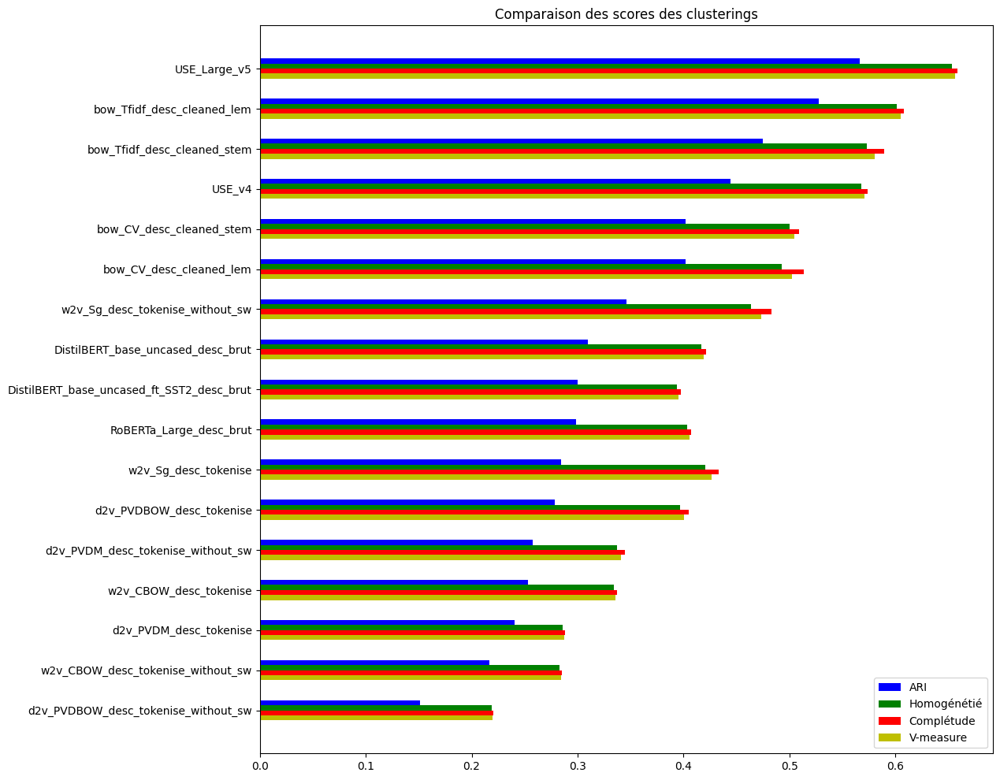

In [5]:
# Visualisation des métriques des clusterings : 
fct_clustering.classement_resultats(dict_desc_class_non_supervisée)

Le modèle d'extraction de features USE_Large_V5 est celui donnant les meilleures performances de clustering.

,Cluster,Nombre,%
0,0,191,18.190476
3,1,149,14.190476
6,2,107,10.190476
2,3,159,15.142857
4,4,143,13.619048
1,5,173,16.476190
5,6,128,12.190476


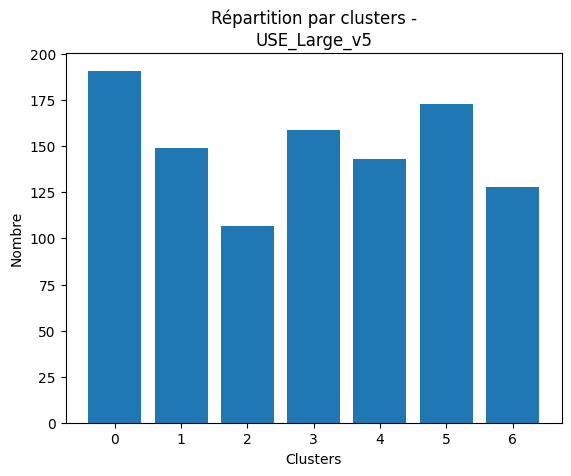

In [6]:
# Caractérisation du clustring pour USE_Large_v5 : 
df_use_large_v5 = dict_desc_class_non_supervisée['USE_Large_v5']['df_vectorisation'].copy()

fct_clustering.generate_cluster_dataframe(
    col_label=df_use_large_v5['Category_predict'],
    title='USE_Large_v5',
    )

In [7]:
# Visualisation des catégories par clusters : 
print('\t----->USE_Large_v5')
df_use_large_v5.groupby('Category_predict')['Category_true'].value_counts().to_frame()

	----->USE_Large_v5


count
Category_predict Category_true                    
0                Kitchen & Dining               87
                 Home Decor & Festive Needs     48
                 Home Furnishing                27
                 Beauty and Personal Care       15
                 Baby Care                      12
                 Watches                         1
                 Computers                       1
1                Watches                       149
2                Home Furnishing                86
                 Baby Care                      20
                 Kitchen & Dining                1
3                Home Decor & Festive Needs     88
                 Kitchen & Dining               51
                 Baby Care                      14
                 Beauty and Personal Care        6
4                Baby Care                     102
                 Home Furnishing                37
                 Beauty and Personal Care        3
                 Kitchen & Dining                1
5                Computers                     149
                 Home Decor & Festive Needs     14
                 Kitchen & Dining                7
                 Beauty and Personal Care        3
6                Beauty and Personal Care      123
                 Kitchen & Dining                3
                 Baby Care                       2

In [8]:
# Récupération du dictionnaire de correspondance 
dico_categ = fct_clustering.find_best_cluster_mapping(
    true_categories=df_use_large_v5['Category_true'],
    cluster_labels=df_use_large_v5['Category_predict'],
)

Meilleure accuracy : 0.7466666666666667
Dictionnaire de traduction :


{0: 'Kitchen & Dining',
 1: 'Watches',
 2: 'Home Furnishing',
 3: 'Home Decor & Festive Needs',
 4: 'Baby Care',
 5: 'Computers',
 6: 'Beauty and Personal Care'}

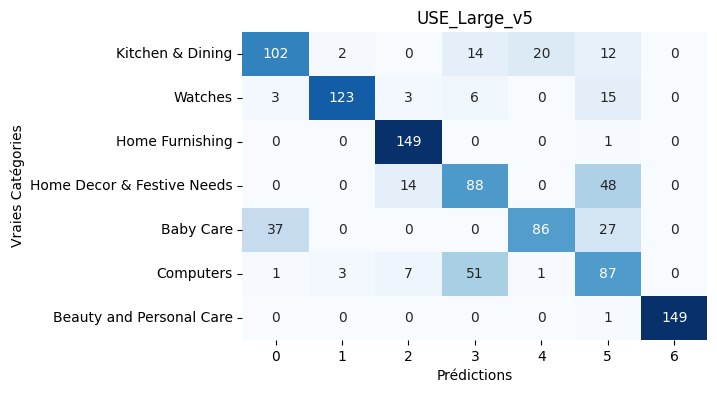

                            precision    recall  f1-score   support

                 Baby Care       0.71      0.68      0.70       150
  Beauty and Personal Care       0.96      0.82      0.88       150
                 Computers       0.86      0.99      0.92       150
Home Decor & Festive Needs       0.55      0.59      0.57       150
           Home Furnishing       0.80      0.57      0.67       150
          Kitchen & Dining       0.46      0.58      0.51       150
                   Watches       1.00      0.99      1.00       150

                  accuracy                           0.75      1050
                 macro avg       0.76      0.75      0.75      1050
              weighted avg       0.76      0.75      0.75      1050



In [9]:
# Métriques sur la qualité de la catégorisation : 

fct_clustering.qualite_categorisation(
    df=df_use_large_v5,
    dico_trad=dico_categ,
    title='USE_Large_v5',
    )

Bilan pour du clustering avec USE_Large_v5 sur les descritpions :  
- ARI = 0.5694
- Précision = 75% 
Cependant, ces clusters sont mélangés entre eux. 

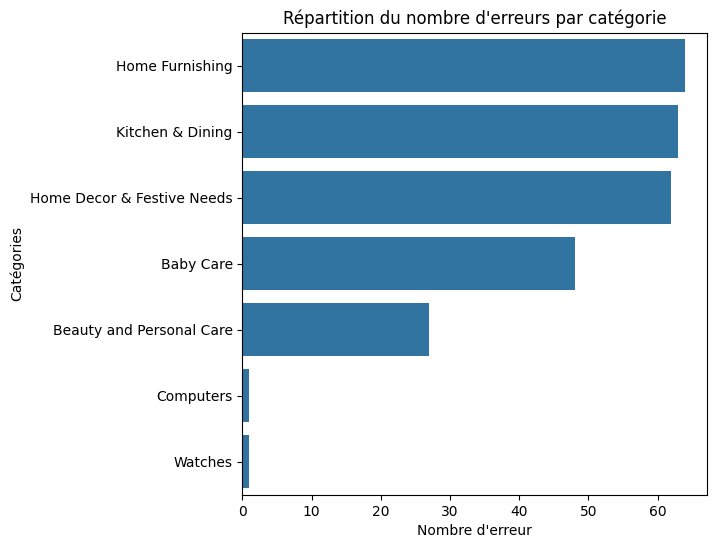

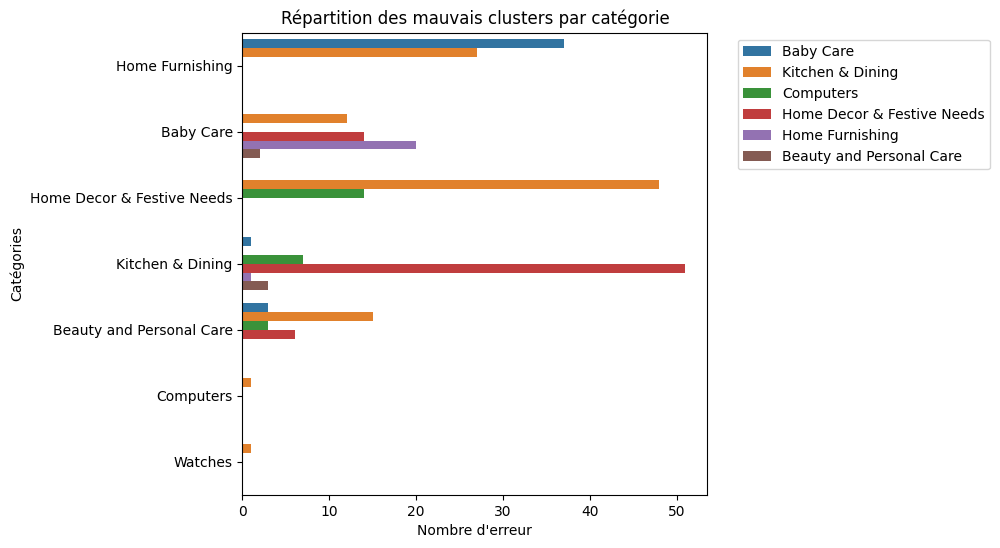

Les plus grosses erreurs sont dues au clusturing de Kitchen & Dining


In [10]:
# Visualisation de la répartition des erreurs par catégories :  
fct_clustering.repartition_erreurs(
    df=df_use_large_v5,
    dico_trad=dico_categ,
)

Bilan :

La catégorisation est faisable dans l'ensemble (75% de bonne catégorisation), mais il y a des différences de performances entre les classes.
Notamment pour : 
- Kitchen & Dining  
- Home Decor & Festive Needs 
- Baby Care




In [11]:
# Visualisation des descriptions de 3 produits par catégories avec une mauvaise classification : 
fct_clustering.dataframe_comp_result(
    df_init=data,
    df_categ=df_use_large_v5,
    dico_trad=dico_categ,
    chemin='1. Données/Images', 
    type='texte'
)

,product_name,description,image,category_true,category_predict
0,"JewelKraft Designs Brown, Pink Table Linen Set","Specifications of JewelKraft Designs Brown, Pi...",26269fd0df12630eec4508c2cf3c94e1.jpg,Home Furnishing,Baby Care
1,Aroma Comfort Polyester Brown Printed Eyelet W...,Key Features of Aroma Comfort Polyester Brown ...,90906358dac904c4f05c12c798ac5221.jpg,Home Furnishing,Baby Care
2,Right Abstract Cushions Cover,"Right Abstract Cushions Cover (40 cm*40 cm, Bl...",3ddd2f062730c2aea8bb8843d5a96125.jpg,Home Furnishing,Kitchen & Dining
3,Uberlyfe Large Vinyl Sticker,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,f2f027ad6a6df617c9f125173da71e44.jpg,Baby Care,Home Decor & Festive Needs
4,Wallmantra Medium Vinyl Stickers Sticker,Buy Wallmantra Medium Vinyl Stickers Sticker f...,be0f39341d771aac57084970f1ed6425.jpg,Baby Care,Home Decor & Festive Needs
5,TRESemme Naturals Vibrantly Smooth Shampoo,Key Features of TRESemme Naturals Vibrantly Sm...,fe05e9ff9e31a310c35626ab6f2b4fe2.jpg,Baby Care,Beauty and Personal Care
6,Like Analog Purple Clock,Specifications of Like Analog Purple Clock Fun...,89b95537d8697203ab278237289a52a8.jpg,Watches,Kitchen & Dining
7,Myesquire Ceramic Burner Pot Lemongrass Liquid...,Myesquire Ceramic Burner Pot Lemongrass Liquid...,f0938b0d88eac91deee6d5add54097d3.jpg,Home Decor & Festive Needs,Kitchen & Dining
8,Radhika's World of Crafts Ganesha with Prabhav...,Radhika's World of Crafts Ganesha with Prabhav...,f28dbe6996336f063e804f353d7de4ce.jpg,Home Decor & Festive Needs,Kitchen & Dining
9,Services Junction Beautiful Black and Golden c...,Key Features of Services Junction Beautiful Bl...,63f2d92a3f5fc6cfc11e7f99d5798eac.jpg,Home Decor & Festive Needs,Kitchen & Dining


----------------------------------------------------------------------------------------------------
Produit 0 :
Nom du produit : JewelKraft Designs Brown, Pink Table Linen Set
Catégorie réelle : Home Furnishing
Catégorie prédite : Baby Care
Description 0 :
Specifications of JewelKraft Designs Brown, Pink Table Linen Set General Brand JewelKraft Designs Design Code MN Style Code 411 Color Brown, Pink In the Box Sales Package 6 table mats 6 napkins 

----------------------------------------------------------------------------------------------------
Produit 1 :
Nom du produit : Aroma Comfort Polyester Brown Printed Eyelet Window Curtain
Catégorie réelle : Home Furnishing
Catégorie prédite : Baby Care
Description 1 :
Key Features of Aroma Comfort Polyester Brown Printed Eyelet Window Curtain Height: 182 cm Width: 121 cm,Specifications of Aroma Comfort Polyester Brown Printed Eyelet Window Curtain (182 cm in Height, Pack of 2) General Brand Aroma Comfort Designed For Window Type Eyelet Mo

1. Une première approche pertinente pour améliorer grandement les catégorisations serait d'imposer un formmatage des descriptions. 

2. Comme constaté, les catégories Kitchen & Dining, Home Decor & Festive Needs et Baby Care sont celles qui posent le plus de problèmes (dû au fait que des articles peuvent être très ressemblant): 
    - Il serait interessant de mieux segmenter ces catégories (sous-catégories plus précises)
    - Lors de la mise ligne d'un nouvel article --> donné un choix relatif au consomateur pour mieux l'orienter dans sa catégorisation. 